In [1]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from mpl_point_clicker import clicker

# Import necessary libraries
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Convertir y guardar los archivos CSV
def save_dict_as_csv(dictionary, filename):
    # Convertir el diccionario a un DataFrame
    df = pd.DataFrame(dictionary)
    # Guardar el DataFrame como archivo CSV
    filepath = os.path.join(output_folder, filename)
    df.to_csv(filepath, index=False)
    print(f"Archivo guardado: {filepath}")


/home/daniel/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:35: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps,
/home/daniel/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:597: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps, copy_X=Tr

In [3]:
id_halo ="17"

# Cargar los datos de los brazos espirales adicionales
arm1_data = pd.read_csv(f'../DATA/processed/TracingPoints/arm_tracing_{id_halo}_arm1_rho_dani.csv')
arm2_data = pd.read_csv(f'../DATA/processed/TracingPoints/arm_tracing_{id_halo}_arm2_rho_dani.csv')
data = pd.read_csv(f'../DATA/processed/TracingPoints/data_rho_{id_halo}_filtered.csv')

# Calcular las coordenadas polares r y theta para cada conjunto de datos
data['r'] = np.sqrt(data['x']**2 + data['y']**2)
data['theta1'] = (180 * np.arctan2(data['y'], data['x']) / np.pi) - 360
data['theta2'] = (180 * np.arctan2(data['y'], data['x']) / np.pi)

arm1_data['r'] = np.sqrt(arm1_data['x']**2 + arm1_data['y']**2)
arm1_data['theta'] = (180 * np.arctan2(arm1_data['y'], arm1_data['x']) / np.pi) - 360

arm2_data['r'] = np.sqrt(arm2_data['x']**2 + arm2_data['y']**2)
arm2_data['theta'] = (180 * np.arctan2(arm2_data['y'], arm2_data['x']) / np.pi) - 360



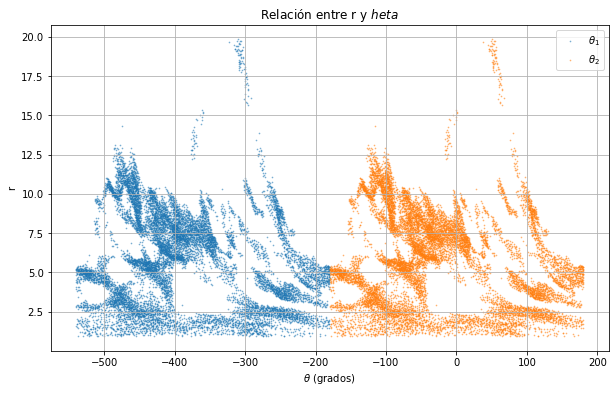

In [4]:
# Calcular las coordenadas polares r y theta
data['r'] = np.sqrt(data['x']**2 + data['y']**2)

# Calcular las variaciones de theta
data['theta1'] = (180 * np.arctan2(data['y'], data['x']) / np.pi) - 360
data['theta2'] = (180 * np.arctan2(data['y'], data['x']) / np.pi)


# Calcular las coordenadas polares r y theta
data['r'] = np.sqrt(data['x']**2 + data['y']**2)

# Calcular las variaciones de theta
data['theta1'] = (180 * np.arctan2(data['y'], data['x']) / np.pi) - 360
data['theta2'] = (180 * np.arctan2(data['y'], data['x']) / np.pi)

# Graficar theta1 y theta2 en la misma gráfica
plt.figure(figsize=(10, 6))

# Graficar theta1
plt.scatter(data['theta1'], data['r'], alpha=0.5, s=0.50, label=r'$\theta_1$')
# Graficar theta2
plt.scatter(data['theta2'], data['r'], alpha=0.5, s=0.50, label=r'$\theta_2$')

# Configurar la gráfica
plt.title('Relación entre r y $\theta$')
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend()
plt.grid(True)

# Mostrar la gráfica
plt.show()

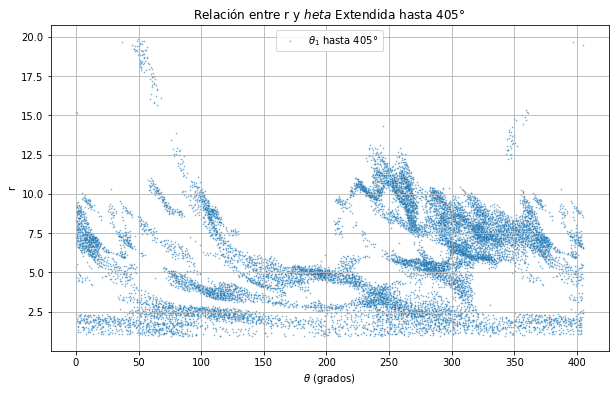

In [5]:
# Calcular las coordenadas polares r y theta
data['r'] = np.sqrt(data['x']**2 + data['y']**2)

# Calcular theta y ajustarlo en el rango 0-405
data['theta1'] = (180 * np.arctan2(data['y'], data['x']) / np.pi)  # Valores base de theta
data['theta1'] = np.where(data['theta1'] < 0, data['theta1'] + 360, data['theta1'])  # Rango [0, 360]

# Extender theta hasta 405 grados
data_extended = data.copy()
data_extended['theta1'] = data_extended['theta1'] + 360  # Desplazar theta al rango [360, 405]
data_combined = pd.concat([data, data_extended], ignore_index=True)

# Filtrar los valores de theta1 hasta 405 grados
data_combined = data_combined[data_combined['theta1'] <= 405]

# Graficar theta1 extendido en el rango [0, 405] junto con r
plt.figure(figsize=(10, 6))

# Graficar los puntos
plt.scatter(data_combined['theta1'], data_combined['r'], alpha=0.5, s=0.5, label=r'$\theta_1$ hasta 405°')

# Configurar la gráfica
plt.title('Relación entre r y $\theta$ Extendida hasta 405°')
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend()
plt.grid(True)

# Mostrar la gráfica
plt.show()


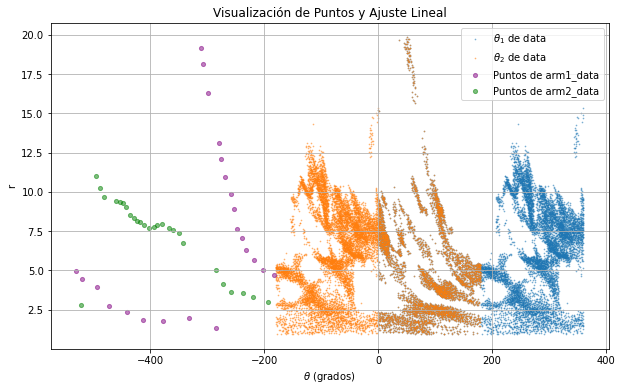

In [6]:
# Visualizar los puntos de fondo y los puntos seleccionados para el ajuste
fig, ax = plt.subplots(figsize=(10, 6))

# Graficar todos los puntos de data
ax.scatter(data['theta1'], data['r'], alpha=0.5, s=0.5, label=r'$\theta_1$ de data')
ax.scatter(data['theta2'], data['r'], alpha=0.5, s=0.5, label=r'$\theta_2$ de data')

# Graficar arm1_data y arm2_data como puntos de fondo
ax.scatter(arm1_data['theta'], arm1_data['r'], color='purple', alpha=0.5, s=17, label='Puntos de arm1_data')
ax.scatter(arm2_data['theta'], arm2_data['r'], color='green', alpha=0.5, s=17, label='Puntos de arm2_data')

ax.set_title('Visualización de Puntos y Ajuste Lineal')
ax.set_xlabel(r'$\theta$ (grados)')
ax.set_ylabel('r')
ax.legend()
plt.grid(True)
plt.show()


In [7]:
# Crear nuevos DataFrames para theta1 y theta2 con sus respectivos valores de r
data_theta1 = pd.DataFrame({'theta': data['theta1'], 'r': data['r']})
data_theta2 = pd.DataFrame({'theta': data['theta2'], 'r': data['r']})


# Concatenar ambos DataFrames
data_combined = pd.concat([data_theta1, data_theta2], ignore_index=True)

data_combined.head(2)

,theta,r
0,243.804105,0.987684
1,234.964728,1.015991


## aplicando la automatización 

In [8]:
# Modular Arm Tracing Notebook
df = pd.read_csv(f'../DATA/processed/TracingPoints/data_rho_{id_halo}_filtered.csv')
Xs    = df.x
Ys    = df.y

prop_final = df.rho_resta_final_exp
samplig_freq = 1


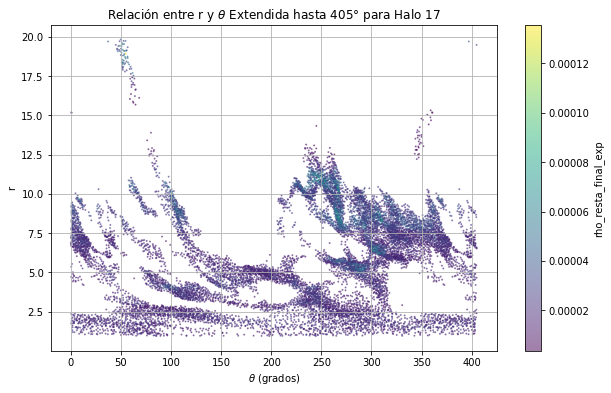

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Leer el archivo CSV
id_halo = '17'  # Reemplaza con el ID correspondiente
df = pd.read_csv(f'../DATA/processed/TracingPoints/data_rho_{id_halo}_filtered.csv')

# Extraer x, y y la propiedad final
Xs = df.x
Ys = df.y
prop_final = df.rho_resta_final_exp

# Calcular coordenadas polares r y theta
df['r'] = np.sqrt(Xs**2 + Ys**2)
df['theta'] = np.degrees(np.arctan2(Ys, Xs))  # Theta en grados [-180, 180]
df['theta'] = np.where(df['theta'] < 0, df['theta'] + 360, df['theta'])  # Ajustar a [0, 360]

# Extender theta hasta 405 grados
df_extended = df.copy()
df_extended['theta'] = df_extended['theta'] + 360  # Desplazar theta al rango [360, 405]

# Duplicar prop_final junto con los datos extendidos
df_extended['rho_resta_final_exp'] = df['rho_resta_final_exp']

# Combinar los DataFrames original y extendido
df_combined = pd.concat([df, df_extended], ignore_index=True)

# Filtrar valores para que theta no exceda 405 grados
df_combined = df_combined[df_combined['theta'] <= 405]

# Graficar los datos extendidos
plt.figure(figsize=(10, 6))

# Visualizar los puntos extendidos hasta 405 grados
plt.scatter(df_combined['theta'], df_combined['r'], c=df_combined['rho_resta_final_exp'], cmap='viridis', s=1, alpha=0.5)
plt.colorbar(label='rho_resta_final_exp')
plt.title(f'Relación entre r y $\\theta$ Extendida hasta 405° para Halo {id_halo}')
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.grid(True)
plt.show()


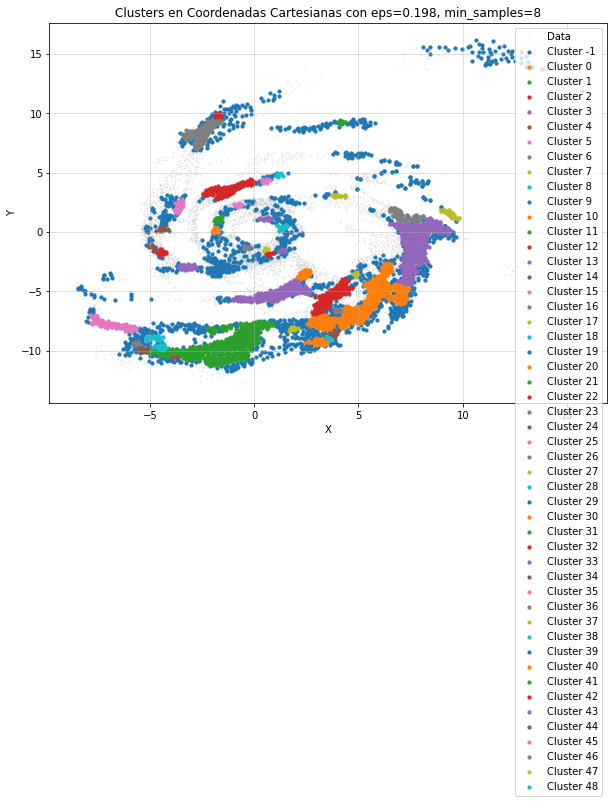

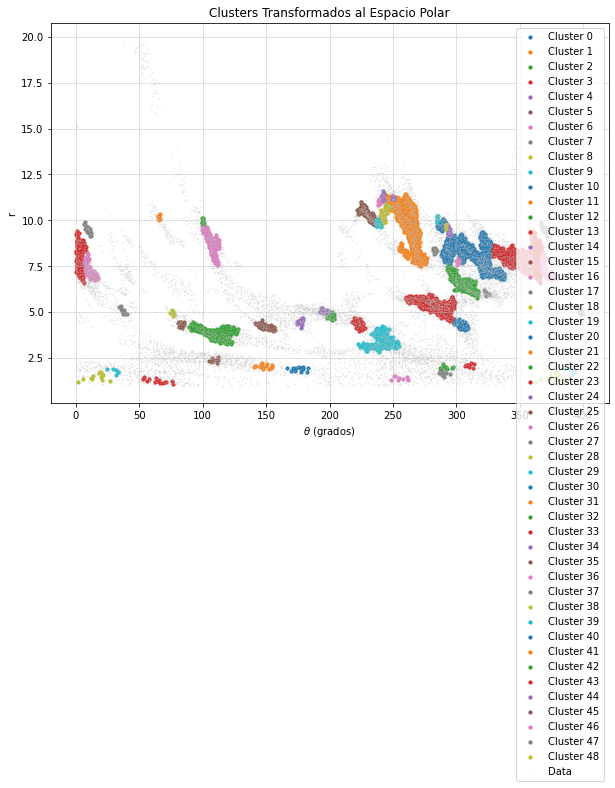

Grupos iniciales preparados: 49 clusters identificados.


In [15]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Convertir a coordenadas polares
df['r'] = np.sqrt(df['x']**2 + df['y']**2)
df['theta'] = np.degrees(np.arctan2(df['y'], df['x']))
df['theta'] = np.where(df['theta'] < 0, df['theta'] + 360, df['theta'])

# Filtrar puntos por el cuartil 85%
threshold = df['rho_resta_final_exp'].quantile(0.60)
df_filtered = df[df['rho_resta_final_exp'] > threshold].sort_values(
    by='rho_resta_final_exp', ascending=False).reset_index(drop=True)

# Extender theta hasta 405 grados
df_filtered_extended = df_filtered.copy()
df_filtered_extended['theta'] = df_filtered_extended['theta'] + 360  # Extender theta al rango [360, 405]

# Combinar el DataFrame original filtrado con el extendido
df_filtered = pd.concat([df_filtered, df_filtered_extended], ignore_index=True)

# Filtrar valores de theta hasta 405 grados (para seguridad)
df_filtered = df_filtered[df_filtered['theta'] <= 405]

# DBSCAN en coordenadas cartesianas
X_cartesian = df_filtered[['x', 'y']].values

# Parámetros de DBSCAN
eps = 0.198
min_samples = 8
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
df_filtered['cluster'] = dbscan.fit_predict(X_cartesian)

# Visualización de clusters en coordenadas cartesianas
plt.figure(figsize=(10, 7))
plt.scatter(df['x'], df['y'], s=0.436, alpha=0.314, color='silver', label='Data')

for cluster_id in np.unique(df_filtered['cluster']):
    cluster_points = df_filtered[df_filtered['cluster'] == cluster_id]
    plt.scatter(cluster_points['x'], cluster_points['y'], label=f'Cluster {cluster_id}', s=10)

plt.title(f"Clusters en Coordenadas Cartesianas con eps={eps}, min_samples={min_samples}")
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.grid(alpha=0.5)
plt.show()

# Transformar los clusters al espacio polar
clusters_polar = {}
for cluster_id in np.unique(df_filtered['cluster']):
    if cluster_id == -1:  # Ignorar puntos de ruido
        continue
    cluster_points = df_filtered[df_filtered['cluster'] == cluster_id]
    clusters_polar[cluster_id] = cluster_points[['r', 'theta']]

# Visualizar los clusters transformados al espacio polar
plt.figure(figsize=(10, 7))
for cluster_id, cluster_points in clusters_polar.items():
    plt.scatter(cluster_points['theta'], cluster_points['r'], label=f'Cluster {cluster_id}', s=10)


plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title(f"Clusters Transformados al Espacio Polar")
plt.xlabel(r"$\theta$ (grados)")
plt.ylabel("r")
plt.legend()
plt.grid(alpha=0.5)
plt.show()

# Preparar los grupos iniciales para ajustes iterativos
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points
    })

# Los grupos ahora están listos para el ajuste iterativo.
print(f"Grupos iniciales preparados: {len(groups)} clusters identificados.")


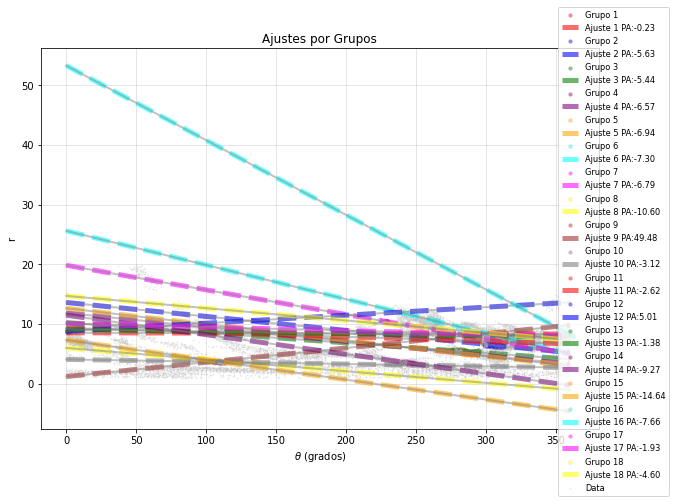

In [17]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Convertir a coordenadas polares
df['r'] = np.sqrt(df['x']**2 + df['y']**2)
df['theta'] = np.degrees(np.arctan2(df['y'], df['x']))
df['theta'] = np.where(df['theta'] < 0, df['theta'] + 360, df['theta'])

# Filtrar puntos por el cuartil 85%
threshold = df['rho_resta_final_exp'].quantile(0.65)
df_filtered = df[df['rho_resta_final_exp'] > threshold].sort_values(
    by='rho_resta_final_exp', ascending=False).reset_index(drop=True)

# Extender theta hasta 405 grados
df_filtered_extended = df_filtered.copy()
df_filtered_extended['theta'] = df_filtered_extended['theta'] + 360  # Extender theta al rango [360, 405]

# Combinar el DataFrame original filtrado con el extendido
df_filtered = pd.concat([df_filtered, df_filtered_extended], ignore_index=True)

# Filtrar valores de theta hasta 405 grados (para seguridad)
df_filtered = df_filtered[df_filtered['theta'] <= 405]

# DBSCAN en coordenadas cartesianas
X_cartesian = df_filtered[['x', 'y']].values

# Parámetros de DBSCAN
eps = 0.198
min_samples = 18
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
df_filtered['cluster'] = dbscan.fit_predict(X_cartesian)

# Transformar los clusters al espacio polar
clusters_polar = {}
for cluster_id in np.unique(df_filtered['cluster']):
    if cluster_id == -1:  # Ignorar puntos de ruido
        continue
    cluster_points = df_filtered[df_filtered['cluster'] == cluster_id]
    clusters_polar[cluster_id] = cluster_points[['r', 'theta']]

# Funciones auxiliares
def calculate_distance(slope, intercept, theta, r):
    predicted_r = slope * theta + intercept
    return abs(predicted_r - r)

def calculate_pa(slope, intercept):
    """Calcula el Position Angle (PA) en grados."""
    if intercept != 0:
        return np.degrees(np.arctan((slope * (180 / np.pi)) / intercept))
    return np.nan  # Evitar divisiones por cero

def is_valid_pa(pa, valid_range):
    return valid_range[0] <= abs(pa) <= valid_range[1]

# Inicializar variables
groups = []  # Lista para almacenar los grupos
radius_tolerance = 0.50  # Radio de tolerancia alrededor del ajuste
flexible_pa_range = (2.0, 50.0)  # Rango más flexible para PA

# Iterar sobre cada cluster inicial para generar ajustes
for cluster_id, cluster_points in clusters_polar.items():
    cluster_df = pd.DataFrame(cluster_points, columns=['r', 'theta'])

    # Generar ajustes iterativos dentro de cada cluster
    while len(cluster_df) >= 3:
        # Seleccionar los primeros tres puntos
        initial_points = cluster_df.iloc[:3]
        cluster_df = cluster_df.iloc[3:]

        X = initial_points[['theta']].values
        y = initial_points['r'].values

        # Ajustar modelo lineal
        model = LinearRegression()
        model.fit(X, y)
        slope = model.coef_[0]
        intercept = model.intercept_
        pa = calculate_pa(slope, intercept)

        group = {'points': initial_points, 'slope': slope, 'intercept': intercept, 'pa': pa}

        # Agregar grupo inicial
        if is_valid_pa(pa, flexible_pa_range) and intercept > 0:
            groups.append(group)

        # Evaluar los puntos restantes dentro del cluster
        to_remove = []
        for i, row in cluster_df.iterrows():
            theta_next = row['theta']
            r_next = row['r']
            distance = calculate_distance(slope, intercept, theta_next, r_next)

            if distance <= radius_tolerance:
                X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                y_new = np.hstack([group['points']['r'].values, r_next])
                model.fit(X_new, y_new)

                group['points'] = pd.concat([group['points'], row.to_frame().T], ignore_index=True)
                group['slope'] = model.coef_[0]
                group['intercept'] = model.intercept_
                group['pa'] = calculate_pa(group['slope'], group['intercept'])

                to_remove.append(i)

        # Eliminar los puntos asignados al grupo actual
        cluster_df = cluster_df.drop(to_remove).reset_index(drop=True)

        # Si quedan puntos no asignados, generar un nuevo ajuste
        if len(cluster_df) >= 3:
            new_initial_points = cluster_df.iloc[:3]
            cluster_df = cluster_df.iloc[3:]

            X_new = new_initial_points[['theta']].values
            y_new = new_initial_points['r'].values

            model.fit(X_new, y_new)
            new_slope = model.coef_[0]
            new_intercept = model.intercept_
            new_pa = calculate_pa(new_slope, new_intercept)

            new_group = {'points': new_initial_points, 'slope': new_slope, 'intercept': new_intercept, 'pa': new_pa}
            if is_valid_pa(new_pa, flexible_pa_range) and new_intercept > 0:
                groups.append(new_group)

# Graficar ajustes
plt.figure(figsize=(10, 7))
colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']

for idx, group in enumerate(groups):
    points = group['points']
    slope = group['slope']
    intercept = group['intercept']
    pa = group['pa']

    plt.scatter(points['theta'], points['r'], s=15.80, alpha=0.46, edgecolor='red', linewidths=0.12,
                label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

    theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
    r_line = slope * theta_line + intercept
    plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.58, label=f'Ajuste {idx+1} PA:{pa:.2f}', color=colors[idx % len(colors)])
    plt.plot(theta_line, r_line, linestyle='-', linewidth=2.03, alpha=0.48, color='gray')

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title("Ajustes por Grupos")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(0.92, 1.12), fontsize=8.3)
plt.grid(True, alpha=0.4)
plt.show()


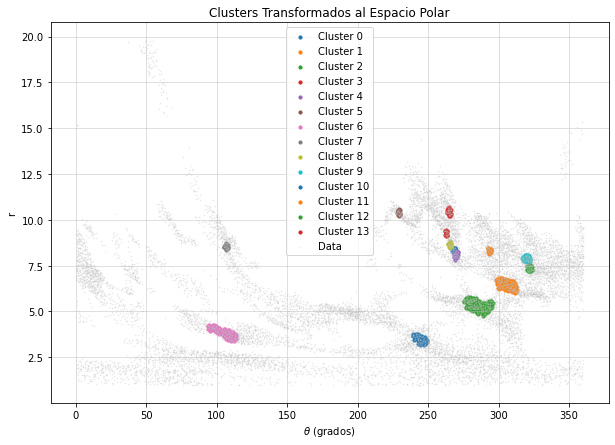

Grupos iniciales preparados: 14 clusters identificados.


In [19]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Supongamos que ya tienes un DataFrame llamado `df` con las columnas `x`, `y`, y `rho_resta_final_exp`.

# Convertir a coordenadas polares
df['r'] = np.sqrt(df['x']**2 + df['y']**2)
df['theta'] = np.degrees(np.arctan2(df['y'], df['x']))
df['theta'] = np.where(df['theta'] < 0, df['theta'] + 360, df['theta'])

# Filtrar puntos por el cuartil 85%
threshold = df['rho_resta_final_exp'].quantile(0.65)
df_filtered = df[df['rho_resta_final_exp'] > threshold].sort_values(by='rho_resta_final_exp', ascending=False).reset_index(drop=True)

# DBSCAN en coordenadas cartesianas
X_cartesian = df_filtered[['x', 'y']].values

# Parámetros de DBSCAN
eps = 0.198
min_samples = 18
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
df_filtered['cluster'] = dbscan.fit_predict(X_cartesian)

# Transformar los clusters al espacio polar
clusters_polar = {}
for cluster_id in np.unique(df_filtered['cluster']):
    if cluster_id == -1:  # Ignorar puntos de ruido
        continue
    cluster_points = df_filtered[df_filtered['cluster'] == cluster_id]
    clusters_polar[cluster_id] = cluster_points[['r', 'theta']]

# Visualizar los clusters transformados al espacio polar
plt.figure(figsize=(10, 7))
for cluster_id, cluster_points in clusters_polar.items():
    plt.scatter(cluster_points['theta'], cluster_points['r'], label=f'Cluster {cluster_id}', s=10)

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title(f"Clusters Transformados al Espacio Polar")
plt.xlabel(r"$\theta$ (grados)")
plt.ylabel("r")
plt.legend()
plt.grid(alpha=0.5)
plt.show()

# Preparar los grupos iniciales para ajustes iterativos
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points
    })

# Los grupos ahora están listos para el ajuste iterativo.
print(f"Grupos iniciales preparados: {len(groups)} clusters identificados.")


In [20]:
# Filtrar grupos con más de 200 puntos
large_groups = [group for group in valid_groups if len(group['points']) > 50]

# Graficar ajustes
plt.figure(figsize=(10, 7))
colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']

for idx, group in enumerate(large_groups):
    points = group['points']
    slope = group['slope']
    intercept = group['intercept']
    pa = group['pa']

    # Graficar puntos del grupo
    plt.scatter(points['theta'], points['r'], s=15.80, alpha=0.46, edgecolor='red', linewidths=0.12,
                label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

    # Graficar la línea de ajuste
    theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
    r_line = slope * theta_line + intercept
    plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.58, label=f'Ajuste {idx+1} PA:{pa:.2f}', color=colors[idx % len(colors)])

# Graficar todos los datos como fondo
plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')

# Configuración de la gráfica
plt.title("Ajustes por Grupos con Más de 200 Puntos")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1.0), fontsize=8)
plt.grid(True, alpha=0.4)
plt.tight_layout()
plt.show()


NameError: name 'valid_groups' is not defined

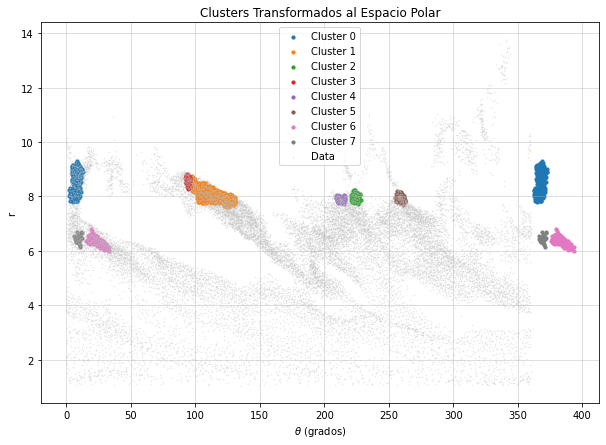

Grupos iniciales preparados: 8 clusters identificados.


In [230]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Supongamos que ya tienes un DataFrame llamado `df` con las columnas `x`, `y`, y `rho_resta_final_exp`.
# Convertir a coordenadas polares
df['r'] = np.sqrt(df['x']**2 + df['y']**2)
df['theta'] = np.degrees(np.arctan2(df['y'], df['x']))
df['theta'] = np.where(df['theta'] < 0, df['theta'] + 360, df['theta'])

# Filtrar puntos por el cuartil 85%
threshold = df['rho_resta_final_exp'].quantile(0.85)
df_filtered = df[df['rho_resta_final_exp'] > threshold].sort_values(
    by='rho_resta_final_exp', ascending=False).reset_index(drop=True)

# Extender theta hasta 405 grados
df_filtered_extended = df_filtered.copy()
df_filtered_extended['theta'] = df_filtered_extended['theta'] + 360  # Extender theta al rango [360, 405]

# Combinar el DataFrame original filtrado con el extendido
df_filtered = pd.concat([df_filtered, df_filtered_extended], ignore_index=True)

# Filtrar valores de theta hasta 405 grados (para seguridad)
df_filtered = df_filtered[df_filtered['theta'] <= 405]

# DBSCAN en coordenadas cartesianas
X_cartesian = df_filtered[['x', 'y']].values

# Parámetros de DBSCAN
eps = 0.198
min_samples = 18
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
df_filtered['cluster'] = dbscan.fit_predict(X_cartesian)

# Transformar los clusters al espacio polar
clusters_polar = {}
for cluster_id in np.unique(df_filtered['cluster']):
    if cluster_id == -1:  # Ignorar puntos de ruido
        continue
    cluster_points = df_filtered[df_filtered['cluster'] == cluster_id]
    clusters_polar[cluster_id] = cluster_points[['r', 'theta']]

# Visualizar los clusters transformados al espacio polar
plt.figure(figsize=(10, 7))
for cluster_id, cluster_points in clusters_polar.items():
    plt.scatter(cluster_points['theta'], cluster_points['r'], label=f'Cluster {cluster_id}', s=10)

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title(f"Clusters Transformados al Espacio Polar")
plt.xlabel(r"$\theta$ (grados)")
plt.ylabel("r")
plt.legend()
plt.grid(alpha=0.5)
plt.show()

# Preparar los grupos iniciales para ajustes iterativos
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points
    })

# Los grupos ahora están listos para el ajuste iterativo.
print(f"Grupos iniciales preparados: {len(groups)} clusters identificados.")


In [210]:
# Funciones auxiliares
def calculate_distance(slope, intercept, theta, r):
    predicted_r = slope * theta + intercept
    return abs(predicted_r - r)

def calculate_pa(slope, intercept):
    """Calcula el Position Angle (PA) en grados."""
    if intercept != 0:
        return np.degrees(np.arctan((slope * (180 / np.pi)) / intercept))
    return np.nan  # Evitar divisiones por cero

def is_valid_pa(pa, valid_range):
    return valid_range[0] <= abs(pa) <= valid_range[1]

# Inicializar variables
radius_tolerance = 0.65  # Radio de tolerancia alrededor del ajuste
point_distance_tolerance = 0.69  # Tolerancia para distancia entre puntos del grupo
flexible_pa_range = (4.0, 30.0)  # Rango de PA ajustado
discarded_points = []  # Lista para puntos descartados

# Preparar los grupos iniciales a partir de los clusters generados por DBSCAN
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points,
        'slope': None,
        'intercept': None,
        'pa': None
    })

# Generar ajustes iterativos dentro de cada cluster inicial
for group in groups:
    cluster_points = group['points']
    if len(cluster_points) < 3:  # Descartar clusters con menos de 3 puntos
        continue

    # Ajustar modelo lineal para el cluster inicial
    X = cluster_points[['theta']].values
    y = cluster_points['r'].values
    model = LinearRegression()
    model.fit(X, y)

    # Guardar los parámetros iniciales del ajuste
    group['slope'] = model.coef_[0]
    group['intercept'] = model.intercept_
    group['pa'] = calculate_pa(group['slope'], group['intercept'])

# Procesar los clusters para agregar puntos adicionales
while len(df_filtered) > 0:
    point = df_filtered.iloc[0]
    df_filtered = df_filtered.iloc[1:]

    theta_next = point['theta']
    r_next = point['r']
    assigned_to_group = False

    for group in groups:
        if group['slope'] is None or group['intercept'] is None:
            continue

        # Verificar si el punto cumple con la distancia al grupo y entre puntos
        distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)
        if distance_to_group <= radius_tolerance:
            # Verificar la distancia entre puntos dentro del grupo
            distances = group['points'].apply(
                lambda row: calculate_distance(group['slope'], group['intercept'], row['theta'], row['r']), axis=1
            )
            if all(distances <= point_distance_tolerance):
                # Recalcular el ajuste del grupo con el nuevo punto
                X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                y_new = np.hstack([group['points']['r'].values, r_next])
                model.fit(X_new, y_new)

                group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                group['slope'] = model.coef_[0]
                group['intercept'] = model.intercept_
                group['pa'] = calculate_pa(group['slope'], group['intercept'])

                assigned_to_group = True
                break

    if not assigned_to_group:
        discarded_points.append(point.to_dict())

# Procesar puntos descartados para intentar asignarlos nuevamente
discarded_points_df = pd.DataFrame(discarded_points)
if not discarded_points_df.empty:
    for _, point in discarded_points_df.iterrows():
        theta_next = point['theta']
        r_next = point['r']
        assigned_to_group = False

        for group in groups:
            if group['slope'] is None or group['intercept'] is None:
                continue

            distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)
            if distance_to_group <= radius_tolerance:
                # Verificar PA y recalcular ajuste si el punto es válido
                pa = calculate_pa(group['slope'], group['intercept'])
                if is_valid_pa(pa, flexible_pa_range):
                    X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                    y_new = np.hstack([group['points']['r'].values, r_next])
                    model.fit(X_new, y_new)

                    group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                    group['slope'] = model.coef_[0]
                    group['intercept'] = model.intercept_
                    group['pa'] = calculate_pa(group['slope'], group['intercept'])

                    assigned_to_group = True
                    break

        if not assigned_to_group:
            # Crear un nuevo grupo si el punto no se pudo asignar
            new_group = pd.DataFrame([point])
            X_new = new_group[['theta']].values
            y_new = new_group['r'].values

            model.fit(X_new, y_new)
            new_slope = model.coef_[0]
            new_intercept = model.intercept_
            new_pa = calculate_pa(new_slope, new_intercept)

            if is_valid_pa(new_pa, flexible_pa_range):
                groups.append({
                    'cluster_id': None,
                    'points': new_group,
                    'slope': new_slope,
                    'intercept': new_intercept,
                    'pa': new_pa
                })


/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:75: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



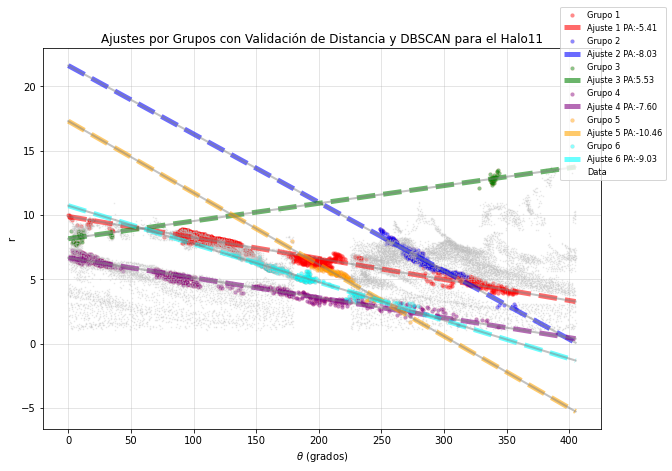

In [211]:

# Filtrar grupos válidos antes de graficar
valid_groups_IT1 = [group for group in groups if 'slope' in group and 'intercept' in group and is_valid_pa(group['pa'], flexible_pa_range)]

# Graficar ajustes
plt.figure(figsize=(10, 7))
colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']

for idx, group in enumerate(valid_groups):
    points = group['points']
    slope = group['slope']
    intercept = group['intercept']
    pa = group['pa']

    plt.scatter(points['theta'], points['r'], s=15.80, alpha=0.46, edgecolor='red', linewidths=0.12,
                label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

    theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
    r_line = slope * theta_line + intercept
    plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.58, label=f'Ajuste {idx+1} PA:{pa:.2f}', color=colors[idx % len(colors)])
    plt.plot(theta_line, r_line, linestyle='-', linewidth=2.03, alpha=0.48, color='gray')

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title("Ajustes por Grupos con Validación de Distancia y DBSCAN para el Halo11")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(0.92, 1.12), fontsize=8.3)
plt.grid(True, alpha=0.4)
plt.show()


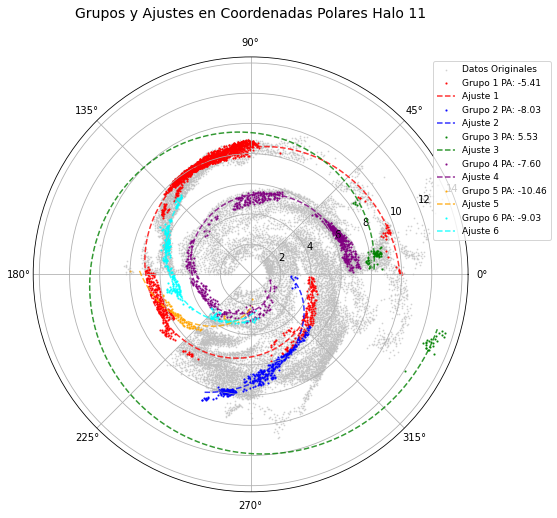

In [212]:
# Graficar en coordenadas polares los ajustes y sus grupos
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 8))

# Graficar todos los puntos originales en coordenadas polares
theta_all = np.radians(df['theta'])
ax.scatter(theta_all, df['r'], s=0.6, alpha=0.6, color='silver', label='Datos Originales')

# Graficar cada grupo válido en coordenadas polares
for idx, group in enumerate(valid_groups):
    points = group['points']
    theta_group = np.radians(points['theta'])
    r_group = points['r']
    pa = group['pa']
    
    # Graficar puntos del grupo
    ax.scatter(theta_group, r_group, s=1.5, alpha=0.8, label=f'Grupo {idx+1} PA: {pa:.2f}', color=colors[idx % len(colors)])
    
    # Graficar el ajuste lineal como una línea en coordenadas polares
    theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
    r_line = group['slope'] * theta_line + group['intercept']
    ax.plot(np.radians(theta_line), r_line, linestyle='--', linewidth=1.5, alpha=0.8, label=f'Ajuste {idx+1}', color=colors[idx % len(colors)])

# Configuración de la gráfica en coordenadas polares
ax.set_title("Grupos y Ajustes en Coordenadas Polares Halo 11", fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0), fontsize=9)
plt.show()


In [186]:
# Mostrar información de los grupos
for idx, group in enumerate(groups):
    print(f"Grupo {idx+1}:")
    print(f" Pendiente: {group['slope']:.4f}, Intercepto: {group['intercept']:.4f}")
    print(f" PA (grados): {group['pa']:.4f}")
    print(f" Puntos en el grupo: {len(group['points'])}")
    print()

# Mostrar puntos descartados
print("Puntos descartados:")
if discarded_points_df.empty:
    print(" No se descartaron puntos.")
else:
    print(discarded_points_df)

Grupo 1:
 Pendiente: -0.0098, Intercepto: 9.1888
 PA (grados): -3.5134
 Puntos en el grupo: 910

Grupo 2:
 Pendiente: -0.0018, Intercepto: 8.3622
 PA (grados): -0.7201
 Puntos en el grupo: 309

Grupo 3:
 Pendiente: -0.0360, Intercepto: 11.9499
 PA (grados): -9.7823
 Puntos en el grupo: 413

Grupo 4:
 Pendiente: -0.0035, Intercepto: 8.6087
 PA (grados): -1.3157
 Puntos en el grupo: 255

Grupo 5:
 Pendiente: -0.0449, Intercepto: 19.3693
 PA (grados): -7.5658
 Puntos en el grupo: 314

Puntos descartados:
        Potential         Rs           U        Zs  cluster  cluster_polar  \
0    -796605.8750   8.767979  373.364075 -0.408696     -1.0           -1.0   
1    -787899.2500  10.584580  247.261353  1.271233     -1.0           47.0   
2    -797487.0000   7.966637  421.899994  0.541263     -1.0           37.0   
3    -788494.8750  10.370435  250.852539  1.230259     -1.0           47.0   
4    -788588.9375  10.357139  249.459366  1.497476     -1.0           47.0   
5    -787405.1875  10.761

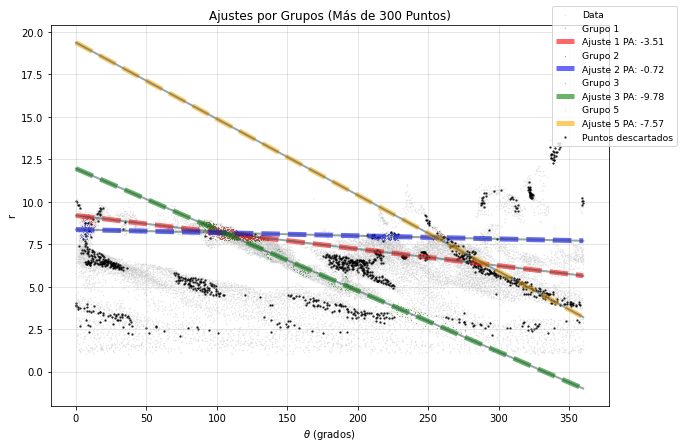

In [187]:
# Graficar ajustes (grupos con más de 3000 puntos)
plt.figure(figsize=(10, 7))

colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']
plt.scatter(df['theta'],df['r'], s=0.36, alpha=0.314, color='silver', label='Data')

for idx, group in enumerate(groups):
    if len(group['points']) > 300:  # Filtrar grupos con más de 3000 puntos
        points = group['points']
        slope = group['slope']
        intercept = group['intercept']
        pa = group['pa'] 

        plt.scatter(points['theta'], points['r'], s=0.980, alpha=0.49, edgecolor='gray', linewidths=0.12,
                    label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

        theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
        r_line = slope * theta_line + intercept
        plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.59, label=f'Ajuste {idx+1} PA: { pa:.2f}', color=colors[idx % len(colors)])
        plt.plot(theta_line, r_line, linestyle='-', linewidth=2.03, alpha=0.50, color='darkslategray')

# Graficar puntos descartados (opcional, mantener por claridad)
if not discarded_points_df.empty:
    plt.scatter(discarded_points_df['theta'], discarded_points_df['r'], s=2, alpha=0.65, color='black', label='Puntos descartados')
plt.title("Ajustes por Grupos (Más de 300 Puntos)")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(0.8902, 1.062), fontsize=9.3)
plt.grid(True, alpha=0.4)
plt.show()


## mas o menos working, moficación de N puntos flexibilización semilla DBSCAN

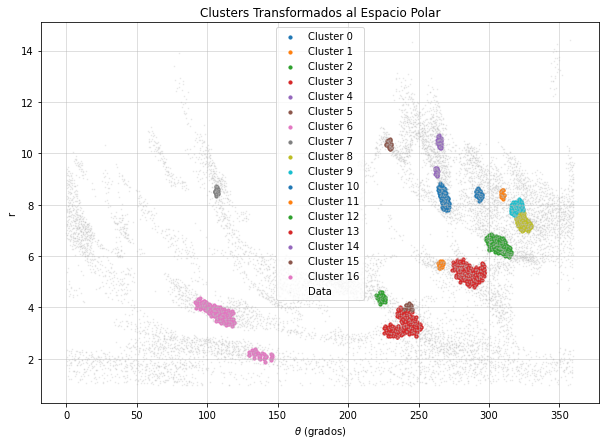

Grupos iniciales preparados: 17 clusters identificados.


In [93]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Supongamos que ya tienes un DataFrame llamado `df` con las columnas `x`, `y`, y `rho_resta_final_exp`.

# Convertir a coordenadas polares
df['r'] = np.sqrt(df['x']**2 + df['y']**2)
df['theta'] = np.degrees(np.arctan2(df['y'], df['x']))
df['theta'] = np.where(df['theta'] < 0, df['theta'] + 360, df['theta'])

# Filtrar puntos dentro del radio 14.5
df = df[df['r'] <= 14.65].reset_index(drop=True)

# Filtrar puntos por el cuartil 85%
threshold = df['rho_resta_final_exp'].quantile(0.50)
df_filtered = df[df['rho_resta_final_exp'] > threshold].sort_values(by='rho_resta_final_exp', ascending=False).reset_index(drop=True)

# DBSCAN en coordenadas cartesianas
X_cartesian = df_filtered[['x', 'y']].values

# Parámetros de DBSCAN
eps = 0.198
min_samples = 18
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
df_filtered['cluster'] = dbscan.fit_predict(X_cartesian)

# Transformar los clusters al espacio polar
clusters_polar = {}
for cluster_id in np.unique(df_filtered['cluster']):
    if cluster_id == -1:  # Ignorar puntos de ruido
        continue
    cluster_points = df_filtered[df_filtered['cluster'] == cluster_id]
    clusters_polar[cluster_id] = cluster_points[['r', 'theta']]

# Visualizar los clusters transformados al espacio polar
plt.figure(figsize=(10, 7))
for cluster_id, cluster_points in clusters_polar.items():
    plt.scatter(cluster_points['theta'], cluster_points['r'], label=f'Cluster {cluster_id}', s=10)

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title(f"Clusters Transformados al Espacio Polar")
plt.xlabel(r"$\theta$ (grados)")
plt.ylabel("r")
plt.legend()
plt.grid(alpha=0.5)
plt.show()

# Preparar los grupos iniciales para ajustes iterativos
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points
    })

# Los grupos ahora están listos para el ajuste iterativo.
print(f"Grupos iniciales preparados: {len(groups)} clusters identificados.")


In [94]:
# Funciones auxiliares
def calculate_distance(slope, intercept, theta, r):
    predicted_r = slope * theta + intercept
    return abs(predicted_r - r)

def calculate_pa(slope, intercept):
    """Calcula el Position Angle (PA) en grados."""
    if intercept != 0:
        return np.degrees(np.arctan((slope * (180 / np.pi)) / intercept))
    return np.nan  # Evitar divisiones por cero

def is_valid_pa(pa, valid_range):
    return valid_range[0] <= abs(pa) <= valid_range[1]

def is_similar_slope(group, theta_next, r_next, slope_tolerance=0.1):
    predicted_r = group['slope'] * theta_next + group['intercept']
    slope_difference = abs((r_next - predicted_r) / (theta_next + 1e-6))  # Evita división por cero
    return slope_difference < slope_tolerance

# Inicializar variables
radius_tolerance = 0.56  # Radio de tolerancia alrededor del ajuste
point_distance_tolerance = 0.58  # Tolerancia para distancia entre puntos del grupo
flexible_pa_range = (3.0, 40.0)  # Rango de PA ajustado
discarded_points = []  # Lista para puntos descartados

# Preparar los grupos iniciales a partir de los clusters generados por DBSCAN
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points,
        'slope': None,
        'intercept': None,
        'pa': None
    })

# Generar ajustes iterativos dentro de cada cluster inicial
for group in groups:
    cluster_points = group['points']
    if len(cluster_points) < 3:  # Descartar clusters con menos de 3 puntos
        continue

    # Ajustar modelo lineal para el cluster inicial
    X = cluster_points[['theta']].values
    y = cluster_points['r'].values
    model = LinearRegression()
    model.fit(X, y)

    # Guardar los parámetros iniciales del ajuste
    group['slope'] = model.coef_[0]
    group['intercept'] = model.intercept_
    group['pa'] = calculate_pa(group['slope'], group['intercept'])

# Función para verificar si un punto está demasiado cerca en r y θ
def is_near_existing_points(group, theta_next, r_next, theta_tolerance=0.345, radius_tolerance=0.211):
    distances_theta = abs(group['points']['theta'] - theta_next)
    distances_r = abs(group['points']['r'] - r_next)
    return np.any((distances_theta < theta_tolerance) & (distances_r < radius_tolerance))

# Procesar los clusters para agregar puntos adicionales con doble validación
while len(df_filtered) > 0:
    point = df_filtered.iloc[0]
    df_filtered = df_filtered.iloc[1:]

    theta_next = point['theta']
    r_next = point['r']
    assigned_to_group = False

    for group in groups:
        if group['slope'] is None or group['intercept'] is None:
            continue

        distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)

        # Aplicar doble condición: distancia al grupo Y evitar puntos demasiado cercanos en theta y r
        if distance_to_group <= radius_tolerance and not is_near_existing_points(group, theta_next, r_next) and is_similar_slope(group, theta_next, r_next):
            distances = group['points'].apply(
                lambda row: calculate_distance(group['slope'], group['intercept'], row['theta'], row['r']), axis=1
            )
            if all(distances <= point_distance_tolerance):
                # Recalcular ajuste con el nuevo punto
                X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                y_new = np.hstack([group['points']['r'].values, r_next])
                model.fit(X_new, y_new)

                group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                group['slope'] = model.coef_[0]
                group['intercept'] = model.intercept_
                group['pa'] = calculate_pa(group['slope'], group['intercept'])

                assigned_to_group = True
                break

    if not assigned_to_group:
        discarded_points.append(point.to_dict())


# Procesar puntos descartados para intentar asignarlos nuevamente
discarded_points_df = pd.DataFrame(discarded_points)
if not discarded_points_df.empty:
    for _, point in discarded_points_df.iterrows():
        theta_next = point['theta']
        r_next = point['r']
        assigned_to_group = False

        for group in groups:
            if group['slope'] is None or group['intercept'] is None:
                continue

            distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)
            if distance_to_group <= radius_tolerance:
                # Verificar PA y recalcular ajuste si el punto es válido
                pa = calculate_pa(group['slope'], group['intercept'])
                if is_valid_pa(pa, flexible_pa_range):
                    X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                    y_new = np.hstack([group['points']['r'].values, r_next])
                    model.fit(X_new, y_new)

                    group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                    group['slope'] = model.coef_[0]
                    group['intercept'] = model.intercept_
                    group['pa'] = calculate_pa(group['slope'], group['intercept'])

                    assigned_to_group = True
                    break

        if not assigned_to_group:
            # Crear un nuevo grupo si el punto no se pudo asignar
            new_group = pd.DataFrame([point])
            X_new = new_group[['theta']].values
            y_new = new_group['r'].values

            model.fit(X_new, y_new)
            new_slope = model.coef_[0]
            new_intercept = model.intercept_
            new_pa = calculate_pa(new_slope, new_intercept)

            if is_valid_pa(new_pa, flexible_pa_range):
                groups.append({
                    'cluster_id': None,
                    'points': new_group,
                    'slope': new_slope,
                    'intercept': new_intercept,
                    'pa': new_pa
                })


/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:86: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:119: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



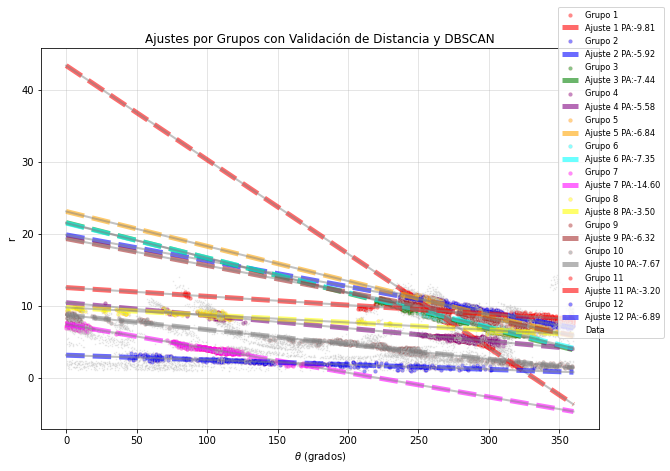

In [95]:

# Filtrar grupos válidos antes de graficar
valid_groups = [group for group in groups if 'slope' in group and 'intercept' in group and is_valid_pa(group['pa'], flexible_pa_range)]

# Graficar ajustes
plt.figure(figsize=(10, 7))
colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']

for idx, group in enumerate(valid_groups):
    points = group['points']
    slope = group['slope']
    intercept = group['intercept']
    pa = group['pa']

    plt.scatter(points['theta'], points['r'], s=15.80, alpha=0.46, edgecolor='red', linewidths=0.12,
                label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

    theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
    r_line = slope * theta_line + intercept
    plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.58, label=f'Ajuste {idx+1} PA:{pa:.2f}', color=colors[idx % len(colors)])
    plt.plot(theta_line, r_line, linestyle='-', linewidth=2.03, alpha=0.48, color='gray')

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title("Ajustes por Grupos con Validación de Distancia y DBSCAN")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(0.92, 1.12), fontsize=8.3)
plt.grid(True, alpha=0.4)
plt.show()


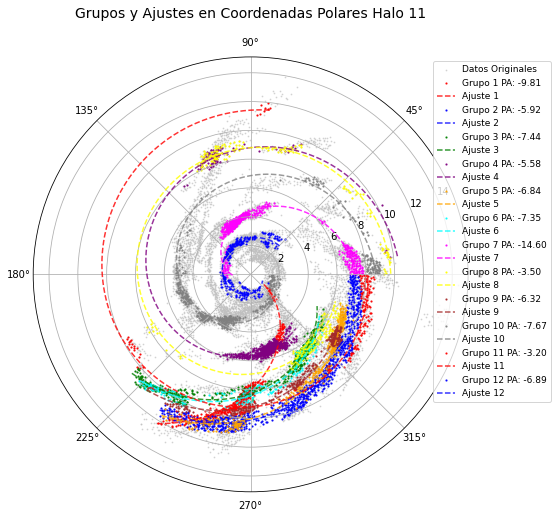

In [96]:
# Graficar en coordenadas polares los ajustes y sus grupos
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 8))

# Graficar todos los puntos originales en coordenadas polares
theta_all = np.radians(df['theta'])
ax.scatter(theta_all, df['r'], s=0.6, alpha=0.6, color='silver', label='Datos Originales')

# Graficar cada grupo válido en coordenadas polares
for idx, group in enumerate(valid_groups):
    points = group['points']
    theta_group = np.radians(points['theta'])
    r_group = points['r']
    pa = group['pa']
    
    # Graficar puntos del grupo
    ax.scatter(theta_group, r_group, s=1.5, alpha=0.8, label=f'Grupo {idx+1} PA: {pa:.2f}', color=colors[idx % len(colors)])
    
    # Graficar el ajuste lineal como una línea en coordenadas polares
    theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
    r_line = group['slope'] * theta_line + group['intercept']
    ax.plot(np.radians(theta_line), r_line, linestyle='--', linewidth=1.5, alpha=0.8, label=f'Ajuste {idx+1}', color=colors[idx % len(colors)])

# Configuración de la gráfica en coordenadas polares
ax.set_title("Grupos y Ajustes en Coordenadas Polares Halo 11", fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0), fontsize=9)
plt.show()


In [97]:
for idx, group in enumerate(valid_groups):
    for sub_idx, sub in enumerate(group['subgroups']):
        points = sub['points']
        slope = sub['slope']
        intercept = sub['intercept']
        pa = sub['pa']

        plt.scatter(points['theta'], points['r'], s=15.80, alpha=0.46,
                    label=f'Grupo {idx+1} - Subgrupo {sub_idx+1}', color=colors[sub_idx % len(colors)])

        theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
        r_line = slope * theta_line + intercept
        plt.plot(theta_line, r_line, linestyle='--', linewidth=2, alpha=0.7, 
                 label=f'Ajuste Grupo {idx+1} - Subgrupo {sub_idx+1} PA:{pa:.2f}', color=colors[sub_idx % len(colors)])


KeyError: 'subgroups'

In [ ]:
N= len(df)/100
N

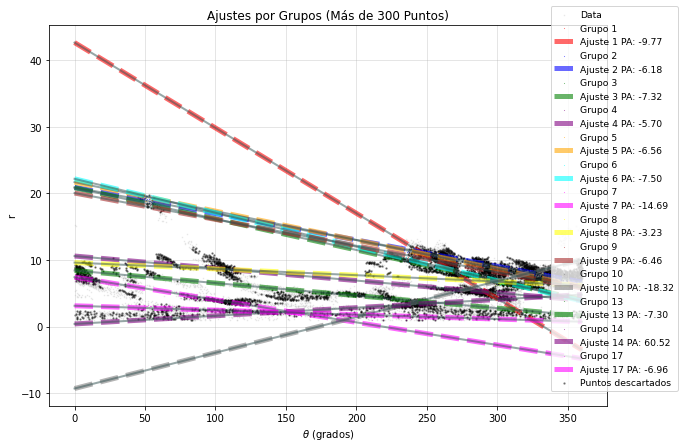

In [69]:
# Graficar ajustes (grupos con más de 300 puntos)
N= len(df)/100
plt.figure(figsize=(10, 7))

colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']
plt.scatter(df['theta'],df['r'], s=0.36, alpha=0.314, color='silver', label='Data')

for idx, group in enumerate(groups):
    if len(group['points']) > N:  # Filtrar grupos con más de 3000 puntos
        points = group['points']
        slope = group['slope']
        intercept = group['intercept']
        pa = group['pa'] 

        plt.scatter(points['theta'], points['r'], s=0.980, alpha=0.49, linewidths=0.12,
                    label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

        theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
        r_line = slope * theta_line + intercept
        plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.59, label=f'Ajuste {idx+1} PA: { pa:.2f}', color=colors[idx % len(colors)])
        plt.plot(theta_line, r_line, linestyle='-', linewidth=2.03, alpha=0.50, color='darkslategray')

# Graficar puntos descartados (opcional, mantener por claridad)
if not discarded_points_df.empty:
    plt.scatter(discarded_points_df['theta'], discarded_points_df['r'], s=2, alpha=0.365, color='black', label='Puntos descartados')
plt.title("Ajustes por Grupos (Más de 300 Puntos)")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(0.8902, 1.062), fontsize=9.3)
plt.grid(True, alpha=0.4)
plt.show()

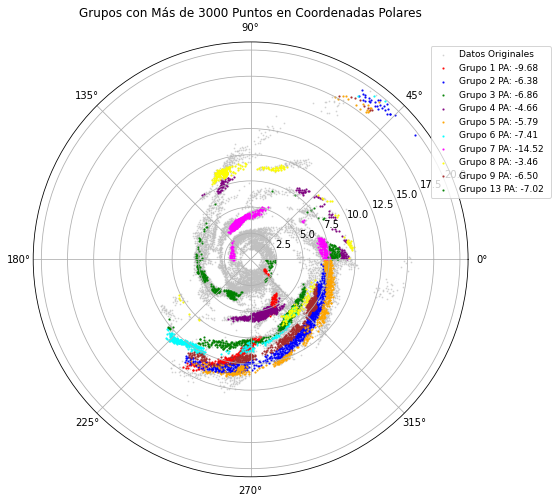

In [63]:
# Graficar en coordenadas polares los grupos con más de 3000 puntos
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(9, 8))

# Graficar todos los puntos en coordenadas polares
theta_all = np.radians(df['theta'])
ax.scatter(theta_all, df['r'], s=0.6, alpha=0.6, color='silver', label='Datos Originales')

for idx, group in enumerate(groups):
    if len(group['points']) > 300:
        points = group['points']
        theta_group = np.radians(points['theta'])
        r_group = points['r']
        pa = group['pa'] 


        
        ax.scatter(theta_group, r_group, s=1.5, alpha=0.8, label=f'Grupo {idx+1} PA: {pa:.2f} ', color=colors[idx % len(colors)])

# Configuración de la gráfica en coordenadas polares
ax.set_title("Grupos con Más de 3000 Puntos en Coordenadas Polares")
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0), fontsize=9)
plt.show()

otra versión v2, 2.1

## Revisión código v2

Clusters 0 y 5 combinados por vecindades cercanas (distancia mínima: 0.655).


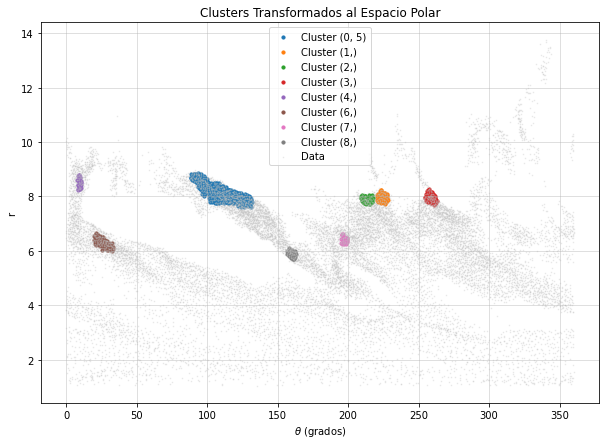

Grupos iniciales preparados: 8 clusters identificados.


In [195]:
# Celda 1: Preprocesamiento y agrupamiento inicial
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Supongamos que ya tienes un DataFrame llamado `df` con las columnas `x`, `y`, y `rho_resta_final_exp`.

# Convertir a coordenadas polares
df['r'] = np.sqrt(df['x']**2 + df['y']**2)
df['theta'] = np.degrees(np.arctan2(df['y'], df['x']))
df['theta'] = np.where(df['theta'] < 0, df['theta'] + 360, df['theta'])

# Filtrar puntos por el cuartil 85%
threshold = df['rho_resta_final_exp'].quantile(0.80)
df_filtered = df[df['rho_resta_final_exp'] > threshold].sort_values(by='rho_resta_final_exp', ascending=False).reset_index(drop=True)

# DBSCAN en coordenadas cartesianas
X_cartesian = df_filtered[['x', 'y']].values

# Parámetros de DBSCAN
eps = 0.198
min_samples = 18
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
df_filtered['cluster'] = dbscan.fit_predict(X_cartesian)
clusters_tolerance = 0.70  

# Transformar los clusters al espacio polar
clusters_polar = {}
for cluster_id in np.unique(df_filtered['cluster']):
    if cluster_id == -1:  # Ignorar puntos de ruido
        continue
    cluster_points = df_filtered[df_filtered['cluster'] == cluster_id]
    clusters_polar[cluster_id] = cluster_points[['r', 'theta']]

# Verificar superposición y combinar clusters cercanos (límites)
def merge_close_clusters(clusters, clusters_tolerance):
    merged_clusters = {}
    used_clusters = set()

    for id1, points1 in clusters.items():
        if id1 in used_clusters:
            continue
        merged_points = points1.copy()
        close_clusters = [id1]

        for id2, points2 in clusters.items():
            if id1 >= id2 or id2 in used_clusters:
                continue

            # Calcular distancia mínima entre los límites (vecindades) de los clusters
            min_distance = np.min(np.sqrt((points1['r'].values[:, None] - points2['r'].values) ** 2 +
                                          (points1['theta'].values[:, None] - points2['theta'].values) ** 2))

            if min_distance < clusters_tolerance:
                print(f"Clusters {id1} y {id2} combinados por vecindades cercanas (distancia mínima: {min_distance:.3f}).")
                merged_points = pd.concat([merged_points, points2], ignore_index=True)
                used_clusters.add(id2)
                close_clusters.append(id2)

        merged_clusters[tuple(close_clusters)] = merged_points
        used_clusters.add(id1)

    return merged_clusters

clusters_polar = merge_close_clusters(clusters_polar, clusters_tolerance)

# Visualizar los clusters transformados al espacio polar
plt.figure(figsize=(10, 7))
for cluster_id, cluster_points in clusters_polar.items():
    plt.scatter(cluster_points['theta'], cluster_points['r'], label=f'Cluster {cluster_id}', s=10)

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title(f"Clusters Transformados al Espacio Polar")
plt.xlabel(r"$\theta$ (grados)")
plt.ylabel("r")
plt.legend()
plt.grid(alpha=0.5)
plt.show()

# Preparar los grupos iniciales para ajustes iterativos
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points
    })

print(f"Grupos iniciales preparados: {len(groups)} clusters identificados.")


In [196]:
# Funciones auxiliares
def calculate_distance(slope, intercept, theta, r):
    predicted_r = slope * theta + intercept
    return abs(predicted_r - r)

def calculate_pa(slope, intercept):
    """Calcula el Position Angle (PA) en grados."""
    if intercept != 0:
        return np.degrees(np.arctan((slope * (180 / np.pi)) / intercept))
    return np.nan  # Evitar divisiones por cero

def is_valid_pa(pa, valid_range):
    return valid_range[0] <= abs(pa) <= valid_range[1]

# Inicializar variables
radius_tolerance = 0.56  # Radio de tolerancia alrededor del ajuste
point_distance_tolerance = 0.58  # Tolerancia para distancia entre puntos del grupo
flexible_pa_range = (4.0, 30.0)  # Rango de PA ajustado
discarded_points = []  # Lista para puntos descartados

# Preparar los grupos iniciales a partir de los clusters generados por DBSCAN
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points,
        'slope': None,
        'intercept': None,
        'pa': None
    })

# Generar ajustes iterativos dentro de cada cluster inicial
for group in groups:
    cluster_points = group['points']
    if len(cluster_points) < 3:  # Descartar clusters con menos de 3 puntos
        continue

    # Ajustar modelo lineal para el cluster inicial
    X = cluster_points[['theta']].values
    y = cluster_points['r'].values
    model = LinearRegression()
    model.fit(X, y)

    # Guardar los parámetros iniciales del ajuste
    group['slope'] = model.coef_[0]
    group['intercept'] = model.intercept_
    group['pa'] = calculate_pa(group['slope'], group['intercept'])

# Procesar los clusters para agregar puntos adicionales
while len(df_filtered) > 0:
    point = df_filtered.iloc[0]
    df_filtered = df_filtered.iloc[1:]

    theta_next = point['theta']
    r_next = point['r']
    assigned_to_group = False

    for group in groups:
        if group['slope'] is None or group['intercept'] is None:
            continue

        # Verificar si el punto cumple con la distancia al grupo y entre puntos
        distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)
        if distance_to_group <= radius_tolerance:
            # Verificar la distancia entre puntos dentro del grupo
            distances = group['points'].apply(
                lambda row: calculate_distance(group['slope'], group['intercept'], row['theta'], row['r']), axis=1
            )
            if all(distances <= point_distance_tolerance):
                # Recalcular el ajuste del grupo con el nuevo punto
                X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                y_new = np.hstack([group['points']['r'].values, r_next])
                model.fit(X_new, y_new)

                group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                group['slope'] = model.coef_[0]
                group['intercept'] = model.intercept_
                group['pa'] = calculate_pa(group['slope'], group['intercept'])

                assigned_to_group = True
                break

    if not assigned_to_group:
        discarded_points.append(point.to_dict())

# Procesar puntos descartados para intentar asignarlos nuevamente
discarded_points_df = pd.DataFrame(discarded_points)
if not discarded_points_df.empty:
    for _, point in discarded_points_df.iterrows():
        theta_next = point['theta']
        r_next = point['r']
        assigned_to_group = False

        for group in groups:
            if group['slope'] is None or group['intercept'] is None:
                continue

            distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)
            if distance_to_group <= radius_tolerance:
                # Verificar PA y recalcular ajuste si el punto es válido
                pa = calculate_pa(group['slope'], group['intercept'])
                if is_valid_pa(pa, flexible_pa_range):
                    X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                    y_new = np.hstack([group['points']['r'].values, r_next])
                    model.fit(X_new, y_new)

                    group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                    group['slope'] = model.coef_[0]
                    group['intercept'] = model.intercept_
                    group['pa'] = calculate_pa(group['slope'], group['intercept'])

                    assigned_to_group = True
                    break

        if not assigned_to_group:
            # Crear un nuevo grupo si el punto no se pudo asignar
            new_group = pd.DataFrame([point])
            X_new = new_group[['theta']].values
            y_new = new_group['r'].values

            model.fit(X_new, y_new)
            new_slope = model.coef_[0]
            new_intercept = model.intercept_
            new_pa = calculate_pa(new_slope, new_intercept)

            if is_valid_pa(new_pa, flexible_pa_range):
                groups.append({
                    'cluster_id': None,
                    'points': new_group,
                    'slope': new_slope,
                    'intercept': new_intercept,
                    'pa': new_pa
                })


/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:75: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



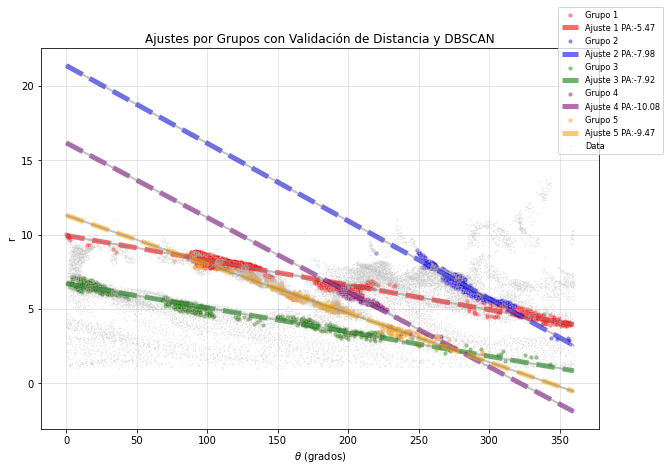

In [197]:

# Filtrar grupos válidos antes de graficar
valid_groups = [group for group in groups if 'slope' in group and 'intercept' in group and is_valid_pa(group['pa'], flexible_pa_range)]

# Graficar ajustes
plt.figure(figsize=(10, 7))
colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']

for idx, group in enumerate(valid_groups):
    points = group['points']
    slope = group['slope']
    intercept = group['intercept']
    pa = group['pa']

    plt.scatter(points['theta'], points['r'], s=15.80, alpha=0.46, edgecolor='red', linewidths=0.12,
                label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

    theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
    r_line = slope * theta_line + intercept
    plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.58, label=f'Ajuste {idx+1} PA:{pa:.2f}', color=colors[idx % len(colors)])
    plt.plot(theta_line, r_line, linestyle='-', linewidth=2.03, alpha=0.48, color='gray')

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title("Ajustes por Grupos con Validación de Distancia y DBSCAN")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(0.92, 1.12), fontsize=8.3)
plt.grid(True, alpha=0.4)
plt.show()


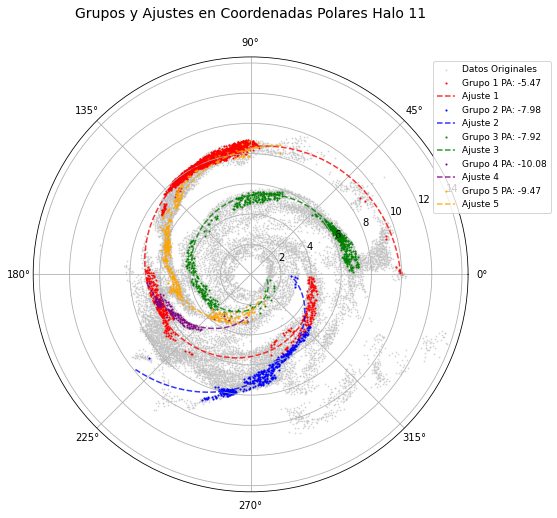

In [198]:
# Graficar en coordenadas polares los ajustes y sus grupos
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 8))

# Graficar todos los puntos originales en coordenadas polares
theta_all = np.radians(df['theta'])
ax.scatter(theta_all, df['r'], s=0.6, alpha=0.6, color='silver', label='Datos Originales')

# Graficar cada grupo válido en coordenadas polares
for idx, group in enumerate(valid_groups):
    points = group['points']
    theta_group = np.radians(points['theta'])
    r_group = points['r']
    pa = group['pa']
    
    # Graficar puntos del grupo
    ax.scatter(theta_group, r_group, s=1.5, alpha=0.8, label=f'Grupo {idx+1} PA: {pa:.2f}', color=colors[idx % len(colors)])
    
    # Graficar el ajuste lineal como una línea en coordenadas polares
    theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
    r_line = group['slope'] * theta_line + group['intercept']
    ax.plot(np.radians(theta_line), r_line, linestyle='--', linewidth=1.5, alpha=0.8, label=f'Ajuste {idx+1}', color=colors[idx % len(colors)])

# Configuración de la gráfica en coordenadas polares
ax.set_title("Grupos y Ajustes en Coordenadas Polares Halo 11", fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0), fontsize=9)
plt.show()


## cuartil 86%  IT2

Clusters 0 y 5 combinados por vecindades cercanas (distancia mínima: 0.655).


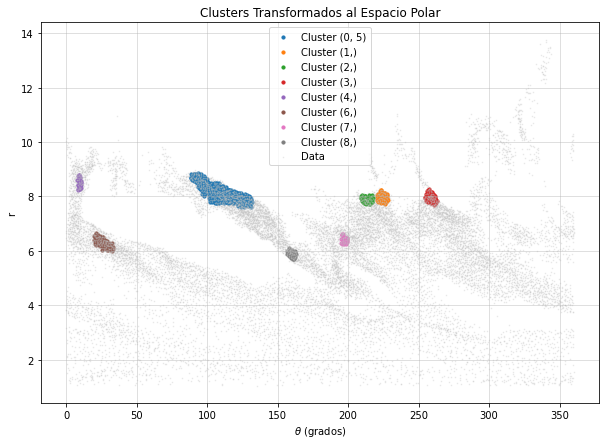

Grupos iniciales preparados: 8 clusters identificados.


In [199]:
# Celda 1: Preprocesamiento y agrupamiento inicial
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Supongamos que ya tienes un DataFrame llamado `df` con las columnas `x`, `y`, y `rho_resta_final_exp`.

# Convertir a coordenadas polares
df['r'] = np.sqrt(df['x']**2 + df['y']**2)
df['theta'] = np.degrees(np.arctan2(df['y'], df['x']))
df['theta'] = np.where(df['theta'] < 0, df['theta'] + 360, df['theta'])

# Filtrar puntos por el cuartil 86%
threshold = df['rho_resta_final_exp'].quantile(0.80)
df_filtered = df[df['rho_resta_final_exp'] > threshold].sort_values(by='rho_resta_final_exp', ascending=False).reset_index(drop=True)

# DBSCAN en coordenadas cartesianas
X_cartesian = df_filtered[['x', 'y']].values

# Parámetros de DBSCAN
eps = 0.198
min_samples = 18
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
df_filtered['cluster'] = dbscan.fit_predict(X_cartesian)
clusters_tolerance = 0.70  

# Transformar los clusters al espacio polar
clusters_polar = {}
for cluster_id in np.unique(df_filtered['cluster']):
    if cluster_id == -1:  # Ignorar puntos de ruido
        continue
    cluster_points = df_filtered[df_filtered['cluster'] == cluster_id]
    clusters_polar[cluster_id] = cluster_points[['r', 'theta']]

# Verificar superposición y combinar clusters cercanos (límites)
def merge_close_clusters(clusters, clusters_tolerance):
    merged_clusters = {}
    used_clusters = set()

    for id1, points1 in clusters.items():
        if id1 in used_clusters:
            continue
        merged_points = points1.copy()
        close_clusters = [id1]

        for id2, points2 in clusters.items():
            if id1 >= id2 or id2 in used_clusters:
                continue

            # Calcular distancia mínima entre los límites (vecindades) de los clusters
            min_distance = np.min(np.sqrt((points1['r'].values[:, None] - points2['r'].values) ** 2 +
                                          (points1['theta'].values[:, None] - points2['theta'].values) ** 2))

            if min_distance < clusters_tolerance:
                print(f"Clusters {id1} y {id2} combinados por vecindades cercanas (distancia mínima: {min_distance:.3f}).")
                merged_points = pd.concat([merged_points, points2], ignore_index=True)
                used_clusters.add(id2)
                close_clusters.append(id2)

        merged_clusters[tuple(close_clusters)] = merged_points
        used_clusters.add(id1)

    return merged_clusters

clusters_polar = merge_close_clusters(clusters_polar, clusters_tolerance)

# Visualizar los clusters transformados al espacio polar
plt.figure(figsize=(10, 7))
for cluster_id, cluster_points in clusters_polar.items():
    plt.scatter(cluster_points['theta'], cluster_points['r'], label=f'Cluster {cluster_id}', s=10)

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title(f"Clusters Transformados al Espacio Polar")
plt.xlabel(r"$\theta$ (grados)")
plt.ylabel("r")
plt.legend()
plt.grid(alpha=0.5)
plt.show()

# Preparar los grupos iniciales para ajustes iterativos
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points
    })

print(f"Grupos iniciales preparados: {len(groups)} clusters identificados.")


In [200]:
# Celda 2: Funciones auxiliares y ajustes iniciales con manejo de conflictos

# Inicializar variables
radius_tolerance = 0.65  # Radio de tolerancia alrededor del ajuste
point_distance_tolerance = 0.69  # Tolerancia para distancia entre puntos del grupo
flexible_pa_range = (4.0, 30.0)  # Rango de PA ajustado
discarded_points = []  # Lista para puntos descartados
conflict_points = []  # Lista para puntos en conflicto

# Funciones auxiliares
def calculate_distance(slope, intercept, theta, r):
    predicted_r = slope * theta + intercept
    return abs(predicted_r - r)

def calculate_pa(slope, intercept):
    if intercept != 0:
        return np.degrees(np.arctan((slope * (180 / np.pi)) / intercept))
    return np.nan

def is_valid_pa(pa, valid_range):
    return valid_range[0] <= abs(pa) <= valid_range[1]

# Preparar los grupos iniciales a partir de los clusters generados por DBSCAN
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points.reset_index(drop=True),  # Resetear índices
        'slope': None,
        'intercept': None,
        'pa': None
    })

# Generar ajustes iterativos dentro de cada cluster inicial
for group in groups:
    cluster_points = group['points']
    if len(cluster_points) < 3:  # Descartar clusters con menos de 3 puntos
        continue

    # Ajustar modelo lineal para el cluster inicial
    X = cluster_points[['theta']].values
    y = cluster_points['r'].values
    model = LinearRegression()
    model.fit(X, y)

    # Guardar los parámetros iniciales del ajuste
    group['slope'] = model.coef_[0]
    group['intercept'] = model.intercept_
    group['pa'] = calculate_pa(group['slope'], group['intercept'])

# Procesar los clusters para agregar puntos adicionales
while len(df_filtered) > 0:
    point = df_filtered.iloc[0]
    df_filtered = df_filtered.iloc[1:]

    theta_next = point['theta']
    r_next = point['r']
    assigned_to_group = False

    for group in groups:
        if group['slope'] is None or group['intercept'] is None:
            continue

        # Verificar si el punto cumple con la distancia al grupo y entre puntos
        distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)
        if distance_to_group <= radius_tolerance:
            # Verificar la distancia entre puntos dentro del grupo
            distances = group['points'].apply(
                lambda row: calculate_distance(group['slope'], group['intercept'], row['theta'], row['r']), axis=1
            )
            if all(distances <= point_distance_tolerance):
                # Recalcular el ajuste del grupo con el nuevo punto
                X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                y_new = np.hstack([group['points']['r'].values, r_next])
                model.fit(X_new, y_new)

                group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                group['slope'] = model.coef_[0]
                group['intercept'] = model.intercept_
                group['pa'] = calculate_pa(group['slope'], group['intercept'])

                assigned_to_group = True
                break

    if not assigned_to_group:
        discarded_points.append(point.to_dict())

# Detectar y manejar puntos en conflicto
for group1 in groups:
    for group2 in groups:
        if group1 is group2:
            continue
        common_points = pd.merge(group1['points'], group2['points'], on=['theta', 'r'], how='inner')
        if not common_points.empty:
            print("Conflictos encontrados y movidos a lista de conflictos")
            conflict_points.extend(common_points.to_dict('records'))

            # Eliminar los puntos conflictivos usando valores en lugar de índices
            group1['points'] = group1['points'].loc[~group1['points'].set_index(['theta', 'r']).index.isin(
                common_points.set_index(['theta', 'r']).index)].reset_index(drop=True)

            group2['points'] = group2['points'].loc[~group2['points'].set_index(['theta', 'r']).index.isin(
                common_points.set_index(['theta', 'r']).index)].reset_index(drop=True)

# Procesar puntos descartados y conflictivos
discarded_points.extend(conflict_points)
discarded_points_df = pd.DataFrame(discarded_points)
if not discarded_points_df.empty:
    for _, point in discarded_points_df.iterrows():
        theta_next = point['theta']
        r_next = point['r']
        assigned_to_group = False

        for group in groups:
            if group['slope'] is None or group['intercept'] is None:
                continue

            distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)
            if distance_to_group <= radius_tolerance:
                # Verificar PA y recalcular ajuste si el punto es válido
                pa = calculate_pa(group['slope'], group['intercept'])
                if is_valid_pa(pa, flexible_pa_range):
                    X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                    y_new = np.hstack([group['points']['r'].values, r_next])
                    model.fit(X_new, y_new)

                    group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                    group['slope'] = model.coef_[0]
                    group['intercept'] = model.intercept_
                    group['pa'] = calculate_pa(group['slope'], group['intercept'])

                    assigned_to_group = True
                    break

        if not assigned_to_group:
            # Crear un nuevo grupo si el punto no se pudo asignar
            new_group = pd.DataFrame([point])
            X_new = new_group[['theta']].values
            y_new = new_group['r'].values

            model.fit(X_new, y_new)
            new_slope = model.coef_[0]
            new_intercept = model.intercept_
            new_pa = calculate_pa(new_slope, new_intercept)

            if is_valid_pa(new_pa, flexible_pa_range):
                groups.append({
                    'cluster_id': None,
                    'points': new_group,
                    'slope': new_slope,
                    'intercept': new_intercept,
                    'pa': new_pa
                })

print(f"Procesamiento completado. Total de grupos: {len(groups)}")


/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:77: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Conflictos encontrados y movidos a lista de conflictos
Conflictos encontrados y movidos a lista de conflictos
Conflictos encontrados y movidos a lista de conflictos
Conflictos encontrados y movidos a lista de conflictos


/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Procesamiento completado. Total de grupos: 8


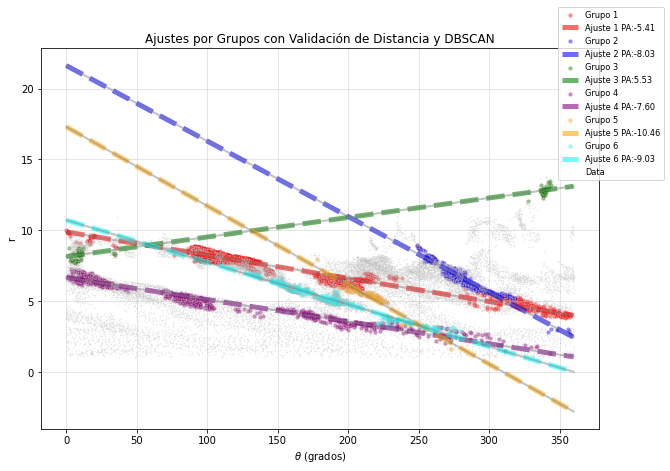

In [201]:

# Filtrar grupos válidos antes de graficar
valid_groups = [group for group in groups if 'slope' in group and 'intercept' in group and is_valid_pa(group['pa'], flexible_pa_range)]

# Graficar ajustes
plt.figure(figsize=(10, 7))
colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']

for idx, group in enumerate(valid_groups):
    points = group['points']
    slope = group['slope']
    intercept = group['intercept']
    pa = group['pa']

    plt.scatter(points['theta'], points['r'], s=15.80, alpha=0.46, edgecolor='red', linewidths=0.12,
                label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

    theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
    r_line = slope * theta_line + intercept
    plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.58, label=f'Ajuste {idx+1} PA:{pa:.2f}', color=colors[idx % len(colors)])
    plt.plot(theta_line, r_line, linestyle='-', linewidth=2.03, alpha=0.48, color='gray')

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title("Ajustes por Grupos con Validación de Distancia y DBSCAN")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(0.92, 1.12), fontsize=8.3)
plt.grid(True, alpha=0.4)
plt.show()


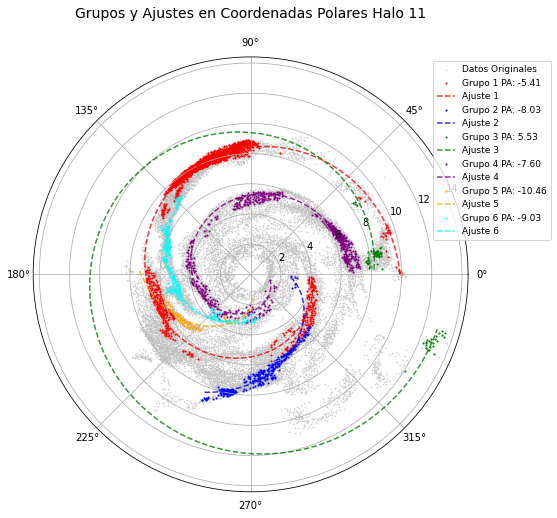

In [202]:
# Graficar en coordenadas polares los ajustes y sus grupos
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 8))

# Graficar todos los puntos originales en coordenadas polares
theta_all = np.radians(df['theta'])
ax.scatter(theta_all, df['r'], s=0.6, alpha=0.6, color='silver', label='Datos Originales')

# Graficar cada grupo válido en coordenadas polares
for idx, group in enumerate(valid_groups):
    points = group['points']
    theta_group = np.radians(points['theta'])
    r_group = points['r']
    pa = group['pa']
    
    # Graficar puntos del grupo
    ax.scatter(theta_group, r_group, s=1.5, alpha=0.8, label=f'Grupo {idx+1} PA: {pa:.2f}', color=colors[idx % len(colors)])
    
    # Graficar el ajuste lineal como una línea en coordenadas polares
    theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
    r_line = group['slope'] * theta_line + group['intercept']
    ax.plot(np.radians(theta_line), r_line, linestyle='--', linewidth=1.5, alpha=0.8, label=f'Ajuste {idx+1}', color=colors[idx % len(colors)])

# Configuración de la gráfica en coordenadas polares
ax.set_title("Grupos y Ajustes en Coordenadas Polares Halo 11", fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0), fontsize=9)
plt.show()

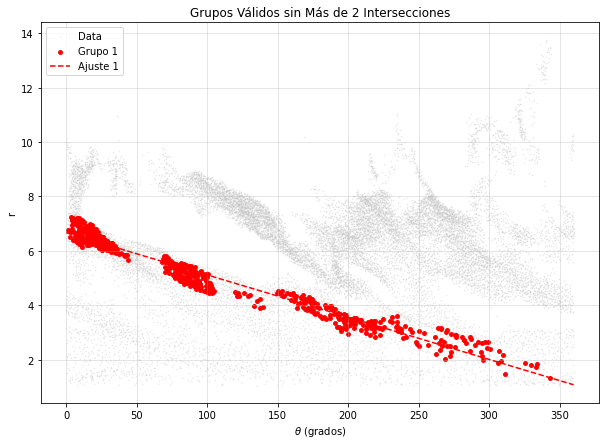

In [205]:
def count_intersections(groups, theta_min, theta_max):
    """
    Cuenta las intersecciones entre las rectas de ajuste de los grupos.
    Retorna una lista de grupos válidos.
    """
    def find_intersection(m1, b1, m2, b2):
        """Calcula el punto de intersección entre dos rectas."""
        if m1 == m2:  # Las rectas son paralelas, no se intersectan
            return None
        theta_inter = (b2 - b1) / (m1 - m2)
        r_inter = m1 * theta_inter + b1
        return theta_inter, r_inter

    valid_groups = []
    for i, group in enumerate(groups):
        slope_1, intercept_1 = group['slope'], group['intercept']
        intersection_count = 0

        for j, other_group in enumerate(groups):
            if i == j:  # No comparar con el mismo grupo
                continue
            slope_2, intercept_2 = other_group['slope'], other_group['intercept']

            intersection = find_intersection(slope_1, intercept_1, slope_2, intercept_2)
            if intersection:
                theta_inter, r_inter = intersection
                # Verificar si la intersección está en el rango de los datos
                if theta_min <= theta_inter <= theta_max:
                    intersection_count += 1

        # Validar que el grupo no tenga más de 2 intersecciones
        if intersection_count <= 3:
            valid_groups.append(group)

    return valid_groups

# Parámetros del dominio de theta
theta_min, theta_max = df['theta'].min(), df['theta'].max()

# Validar grupos
valid_groups_IT2 = count_intersections(groups, theta_min, theta_max)

# Visualización de grupos válidos
plt.figure(figsize=(10, 7))
colors = ['red', 'blue', 'green', 'purple', 'orange']
plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')

for idx, group in enumerate(valid_groups_IT2):
    points = group['points']
    slope = group['slope']
    intercept = group['intercept']

    plt.scatter(points['theta'], points['r'], label=f'Grupo {idx+1}', color=colors[idx % len(colors)], s=15)

    theta_line = np.linspace(theta_min, theta_max, 1000)
    r_line = slope * theta_line + intercept
    plt.plot(theta_line, r_line, '--', label=f'Ajuste {idx+1}', color=colors[idx % len(colors)])

plt.title("Grupos Válidos sin Más de 2 Intersecciones")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend()
plt.grid(alpha=0.4)
plt.show()


In [207]:
# Combinar las listas valid_groups_IT1 y valid_groups_IT2
valid_groups_combined = valid_groups_IT1 + valid_groups_IT2

# Mostrar la cantidad total de grupos combinados
print(f"Total de grupos combinados: {len(valid_groups_combined)}")


Total de grupos combinados: 3


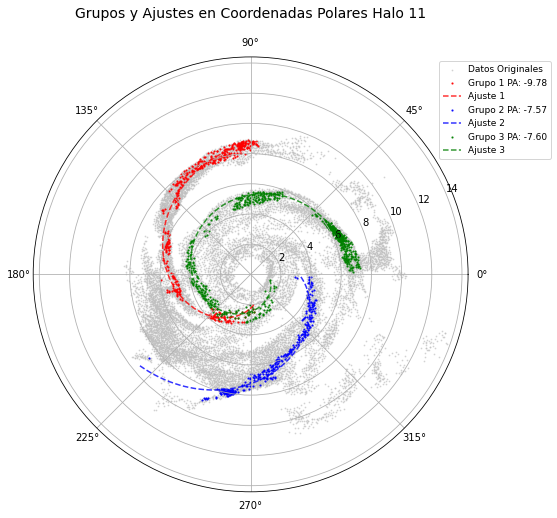

In [208]:
# Graficar en coordenadas polares los ajustes y sus grupos
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 8))

# Graficar todos los puntos originales en coordenadas polares
theta_all = np.radians(df['theta'])
ax.scatter(theta_all, df['r'], s=0.6, alpha=0.6, color='silver', label='Datos Originales')

# Graficar cada grupo válido en coordenadas polares
for idx, group in enumerate(valid_groups_combined):
    points = group['points']
    theta_group = np.radians(points['theta'])
    r_group = points['r']
    pa = group['pa']
    
    # Graficar puntos del grupo
    ax.scatter(theta_group, r_group, s=1.5, alpha=0.8, label=f'Grupo {idx+1} PA: {pa:.2f}', color=colors[idx % len(colors)])
    
    # Graficar el ajuste lineal como una línea en coordenadas polares
    theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
    r_line = group['slope'] * theta_line + group['intercept']
    ax.plot(np.radians(theta_line), r_line, linestyle='--', linewidth=1.5, alpha=0.8, label=f'Ajuste {idx+1}', color=colors[idx % len(colors)])

# Configuración de la gráfica en coordenadas polares
ax.set_title("Grupos y Ajustes en Coordenadas Polares Halo 11", fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0), fontsize=9)
plt.show()

Clusters 0 y 2 combinados por vecindades cercanas (distancia mínima: 0.530).


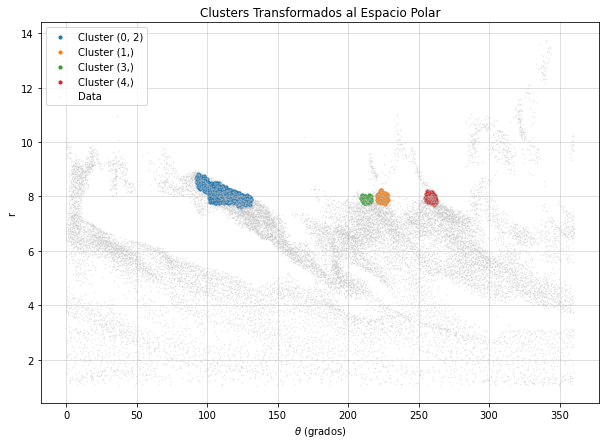

Grupos iniciales preparados: 4 clusters identificados.


In [157]:
# Celda 1: Preprocesamiento y agrupamiento inicial
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Supongamos que ya tienes un DataFrame llamado `df` con las columnas `x`, `y`, y `rho_resta_final_exp`.

# Convertir a coordenadas polares
df['r'] = np.sqrt(df['x']**2 + df['y']**2)
df['theta'] = np.degrees(np.arctan2(df['y'], df['x']))
df['theta'] = np.where(df['theta'] < 0, df['theta'] + 360, df['theta'])

# Filtrar puntos por el cuartil 86%
threshold = df['rho_resta_final_exp'].quantile(0.87)
df_filtered = df[df['rho_resta_final_exp'] > threshold].sort_values(by='rho_resta_final_exp', ascending=False).reset_index(drop=True)

# DBSCAN en coordenadas cartesianas
X_cartesian = df_filtered[['x', 'y']].values

# Parámetros de DBSCAN
eps = 0.198
min_samples = 18
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
df_filtered['cluster'] = dbscan.fit_predict(X_cartesian)
clusters_tolerance = 0.70  

# Transformar los clusters al espacio polar
clusters_polar = {}
for cluster_id in np.unique(df_filtered['cluster']):
    if cluster_id == -1:  # Ignorar puntos de ruido
        continue
    cluster_points = df_filtered[df_filtered['cluster'] == cluster_id]
    clusters_polar[cluster_id] = cluster_points[['r', 'theta']]

# Verificar superposición y combinar clusters cercanos (límites)
def merge_close_clusters(clusters, clusters_tolerance):
    merged_clusters = {}
    used_clusters = set()

    for id1, points1 in clusters.items():
        if id1 in used_clusters:
            continue
        merged_points = points1.copy()
        close_clusters = [id1]

        for id2, points2 in clusters.items():
            if id1 >= id2 or id2 in used_clusters:
                continue

            # Calcular distancia mínima entre los límites (vecindades) de los clusters
            min_distance = np.min(np.sqrt((points1['r'].values[:, None] - points2['r'].values) ** 2 +
                                          (points1['theta'].values[:, None] - points2['theta'].values) ** 2))

            if min_distance < clusters_tolerance:
                print(f"Clusters {id1} y {id2} combinados por vecindades cercanas (distancia mínima: {min_distance:.3f}).")
                merged_points = pd.concat([merged_points, points2], ignore_index=True)
                used_clusters.add(id2)
                close_clusters.append(id2)

        merged_clusters[tuple(close_clusters)] = merged_points
        used_clusters.add(id1)

    return merged_clusters

clusters_polar = merge_close_clusters(clusters_polar, clusters_tolerance)

# Visualizar los clusters transformados al espacio polar
plt.figure(figsize=(10, 7))
for cluster_id, cluster_points in clusters_polar.items():
    plt.scatter(cluster_points['theta'], cluster_points['r'], label=f'Cluster {cluster_id}', s=10)

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title(f"Clusters Transformados al Espacio Polar")
plt.xlabel(r"$\theta$ (grados)")
plt.ylabel("r")
plt.legend()
plt.grid(alpha=0.5)
plt.show()

# Preparar los grupos iniciales para ajustes iterativos
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points
    })

print(f"Grupos iniciales preparados: {len(groups)} clusters identificados.")


In [158]:
# Celda 2: Funciones auxiliares y ajustes iniciales con manejo de conflictos

# Inicializar variables
radius_tolerance = 0.65  # Radio de tolerancia alrededor del ajuste
point_distance_tolerance = 0.69  # Tolerancia para distancia entre puntos del grupo
flexible_pa_range = (4.0, 30.0)  # Rango de PA ajustado
discarded_points = []  # Lista para puntos descartados
conflict_points = []  # Lista para puntos en conflicto

# Funciones auxiliares
def calculate_distance(slope, intercept, theta, r):
    predicted_r = slope * theta + intercept
    return abs(predicted_r - r)

def calculate_pa(slope, intercept):
    if intercept != 0:
        return np.degrees(np.arctan((slope * (180 / np.pi)) / intercept))
    return np.nan

def is_valid_pa(pa, valid_range):
    return valid_range[0] <= abs(pa) <= valid_range[1]

# Preparar los grupos iniciales a partir de los clusters generados por DBSCAN
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points.reset_index(drop=True),  # Resetear índices
        'slope': None,
        'intercept': None,
        'pa': None
    })

# Generar ajustes iterativos dentro de cada cluster inicial
for group in groups:
    cluster_points = group['points']
    if len(cluster_points) < 3:  # Descartar clusters con menos de 3 puntos
        continue

    # Ajustar modelo lineal para el cluster inicial
    X = cluster_points[['theta']].values
    y = cluster_points['r'].values
    model = LinearRegression()
    model.fit(X, y)

    # Guardar los parámetros iniciales del ajuste
    group['slope'] = model.coef_[0]
    group['intercept'] = model.intercept_
    group['pa'] = calculate_pa(group['slope'], group['intercept'])

# Procesar los clusters para agregar puntos adicionales
while len(df_filtered) > 0:
    point = df_filtered.iloc[0]
    df_filtered = df_filtered.iloc[1:]

    theta_next = point['theta']
    r_next = point['r']
    assigned_to_group = False

    for group in groups:
        if group['slope'] is None or group['intercept'] is None:
            continue

        # Verificar si el punto cumple con la distancia al grupo y entre puntos
        distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)
        if distance_to_group <= radius_tolerance:
            # Verificar la distancia entre puntos dentro del grupo
            distances = group['points'].apply(
                lambda row: calculate_distance(group['slope'], group['intercept'], row['theta'], row['r']), axis=1
            )
            if all(distances <= point_distance_tolerance):
                # Recalcular el ajuste del grupo con el nuevo punto
                X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                y_new = np.hstack([group['points']['r'].values, r_next])
                model.fit(X_new, y_new)

                group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                group['slope'] = model.coef_[0]
                group['intercept'] = model.intercept_
                group['pa'] = calculate_pa(group['slope'], group['intercept'])

                assigned_to_group = True
                break

    if not assigned_to_group:
        discarded_points.append(point.to_dict())

# Detectar y manejar puntos en conflicto
for group1 in groups:
    for group2 in groups:
        if group1 is group2:
            continue
        common_points = pd.merge(group1['points'], group2['points'], on=['theta', 'r'], how='inner')
        if not common_points.empty:
            print("Conflictos encontrados y movidos a lista de conflictos")
            conflict_points.extend(common_points.to_dict('records'))

            # Eliminar los puntos conflictivos usando valores en lugar de índices
            group1['points'] = group1['points'].loc[~group1['points'].set_index(['theta', 'r']).index.isin(
                common_points.set_index(['theta', 'r']).index)].reset_index(drop=True)

            group2['points'] = group2['points'].loc[~group2['points'].set_index(['theta', 'r']).index.isin(
                common_points.set_index(['theta', 'r']).index)].reset_index(drop=True)

# Procesar puntos descartados y conflictivos
discarded_points.extend(conflict_points)
discarded_points_df = pd.DataFrame(discarded_points)
if not discarded_points_df.empty:
    for _, point in discarded_points_df.iterrows():
        theta_next = point['theta']
        r_next = point['r']
        assigned_to_group = False

        for group in groups:
            if group['slope'] is None or group['intercept'] is None:
                continue

            distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)
            if distance_to_group <= radius_tolerance:
                # Verificar PA y recalcular ajuste si el punto es válido
                pa = calculate_pa(group['slope'], group['intercept'])
                if is_valid_pa(pa, flexible_pa_range):
                    X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                    y_new = np.hstack([group['points']['r'].values, r_next])
                    model.fit(X_new, y_new)

                    group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                    group['slope'] = model.coef_[0]
                    group['intercept'] = model.intercept_
                    group['pa'] = calculate_pa(group['slope'], group['intercept'])

                    assigned_to_group = True
                    break

        if not assigned_to_group:
            # Crear un nuevo grupo si el punto no se pudo asignar
            new_group = pd.DataFrame([point])
            X_new = new_group[['theta']].values
            y_new = new_group['r'].values

            model.fit(X_new, y_new)
            new_slope = model.coef_[0]
            new_intercept = model.intercept_
            new_pa = calculate_pa(new_slope, new_intercept)

            if is_valid_pa(new_pa, flexible_pa_range):
                groups.append({
                    'cluster_id': None,
                    'points': new_group,
                    'slope': new_slope,
                    'intercept': new_intercept,
                    'pa': new_pa
                })

print(f"Procesamiento completado. Total de grupos: {len(groups)}")


/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:77: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Conflictos encontrados y movidos a lista de conflictos
Conflictos encontrados y movidos a lista de conflictos


/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:127: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Procesamiento completado. Total de grupos: 4


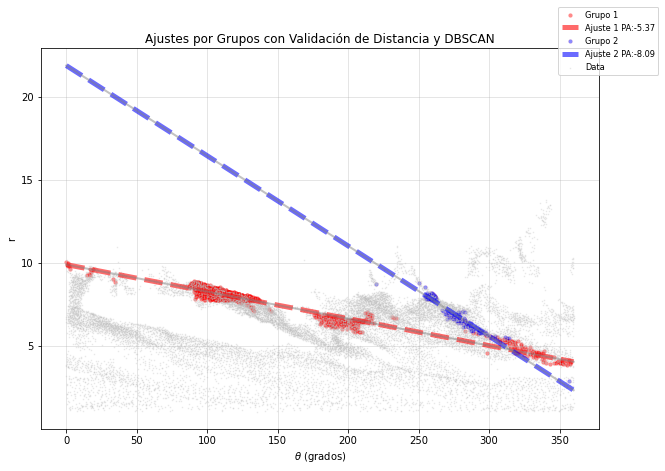

In [159]:

# Filtrar grupos válidos antes de graficar
valid_groups = [group for group in groups if 'slope' in group and 'intercept' in group and is_valid_pa(group['pa'], flexible_pa_range)]

# Graficar ajustes
plt.figure(figsize=(10, 7))
colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']

for idx, group in enumerate(valid_groups):
    points = group['points']
    slope = group['slope']
    intercept = group['intercept']
    pa = group['pa']

    plt.scatter(points['theta'], points['r'], s=15.80, alpha=0.46, edgecolor='red', linewidths=0.12,
                label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

    theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
    r_line = slope * theta_line + intercept
    plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.58, label=f'Ajuste {idx+1} PA:{pa:.2f}', color=colors[idx % len(colors)])
    plt.plot(theta_line, r_line, linestyle='-', linewidth=2.03, alpha=0.48, color='gray')

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title("Ajustes por Grupos con Validación de Distancia y DBSCAN")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(0.92, 1.12), fontsize=8.3)
plt.grid(True, alpha=0.4)
plt.show()


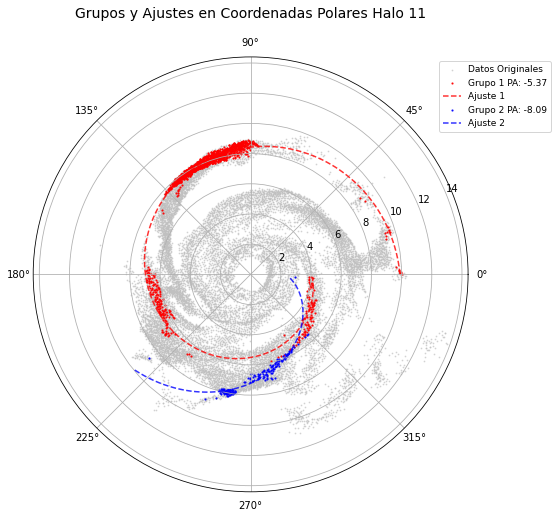

In [160]:
# Graficar en coordenadas polares los ajustes y sus grupos
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 8))

# Graficar todos los puntos originales en coordenadas polares
theta_all = np.radians(df['theta'])
ax.scatter(theta_all, df['r'], s=0.6, alpha=0.6, color='silver', label='Datos Originales')

# Graficar cada grupo válido en coordenadas polares
for idx, group in enumerate(valid_groups):
    points = group['points']
    theta_group = np.radians(points['theta'])
    r_group = points['r']
    pa = group['pa']
    
    # Graficar puntos del grupo
    ax.scatter(theta_group, r_group, s=1.5, alpha=0.8, label=f'Grupo {idx+1} PA: {pa:.2f}', color=colors[idx % len(colors)])
    
    # Graficar el ajuste lineal como una línea en coordenadas polares
    theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
    r_line = group['slope'] * theta_line + group['intercept']
    ax.plot(np.radians(theta_line), r_line, linestyle='--', linewidth=1.5, alpha=0.8, label=f'Ajuste {idx+1}', color=colors[idx % len(colors)])

# Configuración de la gráfica en coordenadas polares
ax.set_title("Grupos y Ajustes en Coordenadas Polares Halo 11", fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0), fontsize=9)
plt.show()

Grupo (0, 5): Total puntos = 1558, Filtrados = 1480
Grupo (3,): Total puntos = 350, Filtrados = 332
Grupo (6,): Total puntos = 601, Filtrados = 571
Grupo (7,): Total puntos = 113, Filtrados = 107
Grupo (8,): Total puntos = 351, Filtrados = 333


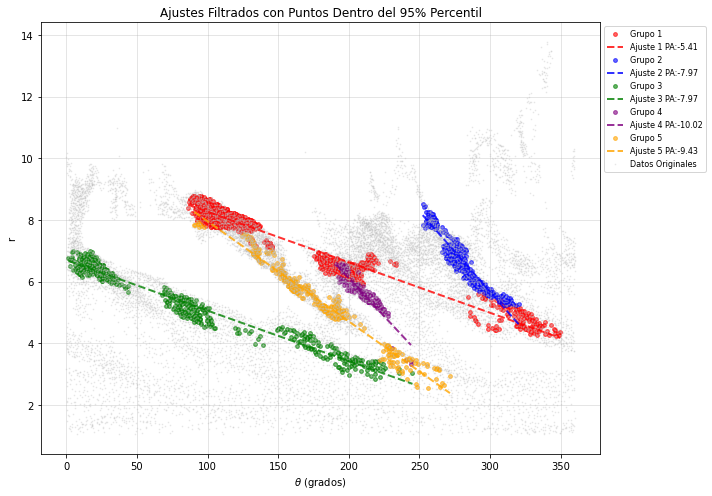

In [135]:
def filter_points_within_percentile(groups, lower_percentile=2.5, upper_percentile=97.5):
    """
    Filtra puntos dentro del rango definido por percentiles para cada grupo válido.
    """
    filtered_groups = []

    for group in groups:
        points = group['points']

        # Calcular percentiles en la columna 'r' (radio)
        lower_bound = points['r'].quantile(lower_percentile / 100)
        upper_bound = points['r'].quantile(upper_percentile / 100)

        # Filtrar puntos dentro del rango de percentiles
        filtered_points = points[(points['r'] >= lower_bound) & (points['r'] <= upper_bound)]

        print(f"Grupo {group['cluster_id']}: Total puntos = {len(points)}, Filtrados = {len(filtered_points)}")

        # Crear el grupo filtrado
        filtered_groups.append({
            'cluster_id': group['cluster_id'],
            'points': filtered_points,
            'slope': None,
            'intercept': None,
            'pa': None
        })

    # Recalcular ajustes lineales para los grupos filtrados
    for group in filtered_groups:
        if len(group['points']) < 3:
            continue  # Ignorar grupos con menos de 3 puntos
        X = group['points'][['theta']].values
        y = group['points']['r'].values
        model = LinearRegression()
        model.fit(X, y)
        group['slope'] = model.coef_[0]
        group['intercept'] = model.intercept_
        group['pa'] = calculate_pa(group['slope'], group['intercept'])

    return filtered_groups

# Filtrar los puntos dentro del 95% y recalcular ajustes
filtered_valid_groups = filter_points_within_percentile(valid_groups, lower_percentile=2.5, upper_percentile=97.5)

# Graficar ajustes después del filtrado
plt.figure(figsize=(10, 7))
colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']

for idx, group in enumerate(filtered_valid_groups):
    points = group['points']
    slope = group['slope']
    intercept = group['intercept']
    pa = group['pa']

    # Graficar puntos filtrados
    plt.scatter(points['theta'], points['r'], s=15, alpha=0.6, label=f'Grupo {idx+1}', color=colors[idx % len(colors)])
    
    # Graficar ajuste lineal
    if slope is not None and intercept is not None:
        theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
        r_line = slope * theta_line + intercept
        plt.plot(theta_line, r_line, linestyle='--', linewidth=2, alpha=0.8,
                 label=f'Ajuste {idx+1} PA:{pa:.2f}', color=colors[idx % len(colors)])

# Graficar datos originales para referencia
plt.scatter(df['theta'], df['r'], s=0.5, alpha=0.3, color='silver', label='Datos Originales')

plt.title("Ajustes Filtrados con Puntos Dentro del 95% Percentil")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=8)
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()


Grupos antes de la fusión:


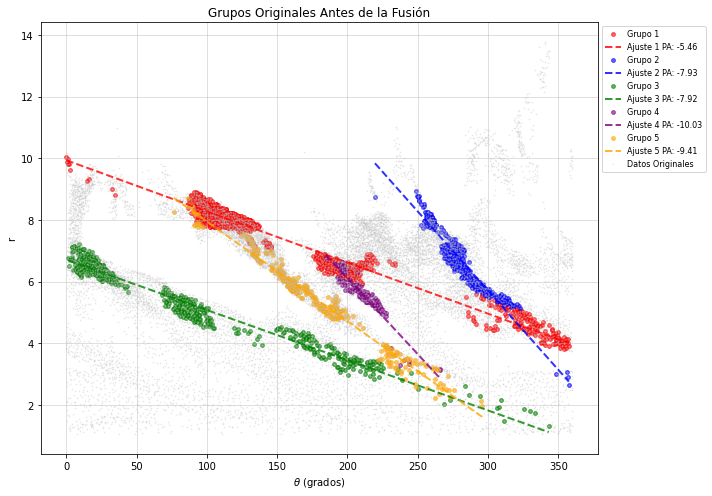

Fusión de Grupo 0 con Grupo 3 (Distancia mínima: 0.000).
Fusión de Grupo 2 con Grupo 4 (Distancia mínima: 0.160).
Grupos después de la fusión:


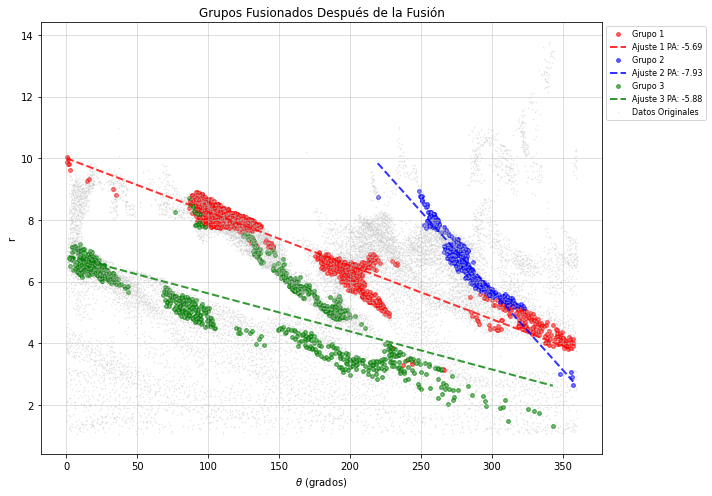

In [114]:
# Celda: Graficar grupos antes y después de la fusión

def plot_groups(groups, title, colors, figure_number=1):
    """Función para graficar los grupos."""
    plt.figure(figure_number, figsize=(10, 7))

    for idx, group in enumerate(groups):
        points = group['points']
        slope = group.get('slope', None)
        intercept = group.get('intercept', None)
        pa = group.get('pa', None)

        # Graficar puntos
        plt.scatter(points['theta'], points['r'], s=15, alpha=0.6,
                    label=f'Grupo {idx+1}', color=colors[idx % len(colors)])
        
        # Graficar ajuste lineal
        if slope is not None and intercept is not None:
            theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
            r_line = slope * theta_line + intercept
            plt.plot(theta_line, r_line, linestyle='--', linewidth=2, alpha=0.8,
                     label=f'Ajuste {idx+1} PA: {pa:.2f}', color=colors[idx % len(colors)])

    # Datos originales
    plt.scatter(df['theta'], df['r'], s=0.5, alpha=0.3, color='silver', label='Datos Originales')

    plt.title(title)
    plt.xlabel(r'$\theta$ (grados)')
    plt.ylabel('r')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=8)
    plt.grid(alpha=0.5)
    plt.tight_layout()
    plt.show()

# Parámetro de tolerancia para fusión
cluster_tolerance = 0.5  # Ajustar según necesidad

# 1. Graficar grupos originales (antes de la fusión)
print("Grupos antes de la fusión:")
plot_groups(valid_groups, "Grupos Originales Antes de la Fusión", 
            colors=['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray'], figure_number=1)

# 2. Fusionar grupos al más cercano
groups_after_merge = merge_groups_to_closest(valid_groups, cluster_tolerance)

# Recalcular ajustes lineales para los nuevos grupos fusionados
for group in groups_after_merge:
    if len(group['points']) < 3:
        continue
    X = group['points'][['theta']].values
    y = group['points']['r'].values
    model = LinearRegression()
    model.fit(X, y)
    group['slope'] = model.coef_[0]
    group['intercept'] = model.intercept_
    group['pa'] = calculate_pa(group['slope'], group['intercept'])

# 3. Graficar grupos fusionados (después de la fusión)
print("Grupos después de la fusión:")
plot_groups(groups_after_merge, "Grupos Fusionados Después de la Fusión", 
            colors=['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray'], figure_number=2)


## Revisión código v1

In [68]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Supongamos que ya tienes un DataFrame llamado `df` con las columnas `x`, `y`, y `rho_resta_final_exp`.

# Convertir a coordenadas polares
df['r'] = np.sqrt(df['x']**2 + df['y']**2)
df['theta'] = np.degrees(np.arctan2(df['y'], df['x']))
df['theta'] = np.where(df['theta'] < 0, df['theta'] + 360, df['theta'])

# Filtrar puntos por el cuartil 85%
threshold = df['rho_resta_final_exp'].quantile(0.80)
df_filtered = df[df['rho_resta_final_exp'] > threshold].sort_values(by='rho_resta_final_exp', ascending=False).reset_index(drop=True)

# DBSCAN en coordenadas cartesianas
X_cartesian = df_filtered[['x', 'y']].values

# Parámetros de DBSCAN
eps = 0.198
min_samples = 18
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
df_filtered['cluster'] = dbscan.fit_predict(X_cartesian)

# Transformar los clusters al espacio polar
clusters_polar = {}
for cluster_id in np.unique(df_filtered['cluster']):
    if cluster_id == -1:  # Ignorar puntos de ruido
        continue
    cluster_points = df_filtered[df_filtered['cluster'] == cluster_id]
    clusters_polar[cluster_id] = cluster_points[['r', 'theta']]


In [69]:
# Celda 2: Funciones auxiliares y ajustes iniciales con manejo de conflictos

# Inicializar variables
radius_tolerance = 0.56  # Radio de tolerancia alrededor del ajuste
point_distance_tolerance = 0.58  # Tolerancia para distancia entre puntos del grupo
flexible_pa_range = (4.0, 30.0)  # Rango de PA ajustado
discarded_points = []  # Lista para puntos descartados
conflict_points = []  # Lista para puntos en conflicto

# Funciones auxiliares
def calculate_distance(slope, intercept, theta, r):
    predicted_r = slope * theta + intercept
    return abs(predicted_r - r)

def calculate_pa(slope, intercept):
    if intercept != 0:
        return np.degrees(np.arctan((slope * (180 / np.pi)) / intercept))
    return np.nan

def is_valid_pa(pa, valid_range):
    return valid_range[0] <= abs(pa) <= valid_range[1]

# Preparar los grupos iniciales a partir de los clusters generados por DBSCAN
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points.reset_index(drop=True),  # Resetear índices
        'slope': None,
        'intercept': None,
        'pa': None
    })

# Generar ajustes iterativos dentro de cada cluster inicial
for group in groups:
    cluster_points = group['points']
    if len(cluster_points) < 3:  # Descartar clusters con menos de 3 puntos
        continue

    # Ajustar modelo lineal para el cluster inicial
    X = cluster_points[['theta']].values
    y = cluster_points['r'].values
    model = LinearRegression()
    model.fit(X, y)

    # Guardar los parámetros iniciales del ajuste
    group['slope'] = model.coef_[0]
    group['intercept'] = model.intercept_
    group['pa'] = calculate_pa(group['slope'], group['intercept'])

# Procesar los clusters para agregar puntos adicionales
while len(df_filtered) > 0:
    point = df_filtered.iloc[0]
    df_filtered = df_filtered.iloc[1:]

    theta_next = point['theta']
    r_next = point['r']
    assigned_to_group = False

    for group in groups:
        if group['slope'] is None or group['intercept'] is None:
            continue

        # Verificar si el punto cumple con la distancia al grupo y entre puntos
        distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)
        if distance_to_group <= radius_tolerance:
            # Verificar la distancia entre puntos dentro del grupo
            distances = group['points'].apply(
                lambda row: calculate_distance(group['slope'], group['intercept'], row['theta'], row['r']), axis=1
            )
            if all(distances <= point_distance_tolerance):
                # Recalcular el ajuste del grupo con el nuevo punto
                X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                y_new = np.hstack([group['points']['r'].values, r_next])
                model.fit(X_new, y_new)

                group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                group['slope'] = model.coef_[0]
                group['intercept'] = model.intercept_
                group['pa'] = calculate_pa(group['slope'], group['intercept'])

                assigned_to_group = True
                break

    if not assigned_to_group:
        discarded_points.append(point.to_dict())

# Detectar y manejar puntos en conflicto
for group1 in groups:
    for group2 in groups:
        if group1 is group2:
            continue
        common_points = pd.merge(group1['points'], group2['points'], on=['theta', 'r'], how='inner')
        if not common_points.empty:
            print("Conflictos encontrados y movidos a lista de conflictos")
            conflict_points.extend(common_points.to_dict('records'))

            # Eliminar los puntos conflictivos usando valores en lugar de índices
            group1['points'] = group1['points'].loc[~group1['points'].set_index(['theta', 'r']).index.isin(
                common_points.set_index(['theta', 'r']).index)].reset_index(drop=True)

            group2['points'] = group2['points'].loc[~group2['points'].set_index(['theta', 'r']).index.isin(
                common_points.set_index(['theta', 'r']).index)].reset_index(drop=True)

# Procesar puntos descartados y conflictivos
discarded_points.extend(conflict_points)
discarded_points_df = pd.DataFrame(discarded_points)
if not discarded_points_df.empty:
    for _, point in discarded_points_df.iterrows():
        theta_next = point['theta']
        r_next = point['r']
        assigned_to_group = False

        for group in groups:
            if group['slope'] is None or group['intercept'] is None:
                continue

            distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)
            if distance_to_group <= radius_tolerance:
                # Verificar PA y recalcular ajuste si el punto es válido
                pa = calculate_pa(group['slope'], group['intercept'])
                if is_valid_pa(pa, flexible_pa_range):
                    X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                    y_new = np.hstack([group['points']['r'].values, r_next])
                    model.fit(X_new, y_new)

                    group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                    group['slope'] = model.coef_[0]
                    group['intercept'] = model.intercept_
                    group['pa'] = calculate_pa(group['slope'], group['intercept'])

                    assigned_to_group = True
                    break

        if not assigned_to_group:
            # Crear un nuevo grupo si el punto no se pudo asignar
            new_group = pd.DataFrame([point])
            X_new = new_group[['theta']].values
            y_new = new_group['r'].values

            model.fit(X_new, y_new)
            new_slope = model.coef_[0]
            new_intercept = model.intercept_
            new_pa = calculate_pa(new_slope, new_intercept)

            if is_valid_pa(new_pa, flexible_pa_range):
                groups.append({
                    'cluster_id': None,
                    'points': new_group,
                    'slope': new_slope,
                    'intercept': new_intercept,
                    'pa': new_pa
                })

print(f"Procesamiento completado. Total de grupos: {len(groups)}")


/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:77: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Conflictos encontrados y movidos a lista de conflictos
Conflictos encontrados y movidos a lista de conflictos


KeyError: '[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22] not found in axis'

In [ ]:

# Filtrar grupos válidos antes de graficar
valid_groups = [group for group in groups if 'slope' in group and 'intercept' in group and is_valid_pa(group['pa'], flexible_pa_range)]

# Graficar ajustes
plt.figure(figsize=(10, 7))
colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']

for idx, group in enumerate(valid_groups):
    points = group['points']
    slope = group['slope']
    intercept = group['intercept']
    pa = group['pa']

    plt.scatter(points['theta'], points['r'], s=15.80, alpha=0.46, edgecolor='red', linewidths=0.12,
                label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

    theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
    r_line = slope * theta_line + intercept
    plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.58, label=f'Ajuste {idx+1} PA:{pa:.2f}', color=colors[idx % len(colors)])
    plt.plot(theta_line, r_line, linestyle='-', linewidth=2.03, alpha=0.48, color='gray')

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title("Ajustes por Grupos con Validación de Distancia y DBSCAN")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(0.92, 1.12), fontsize=8.3)
plt.grid(True, alpha=0.4)
plt.show()

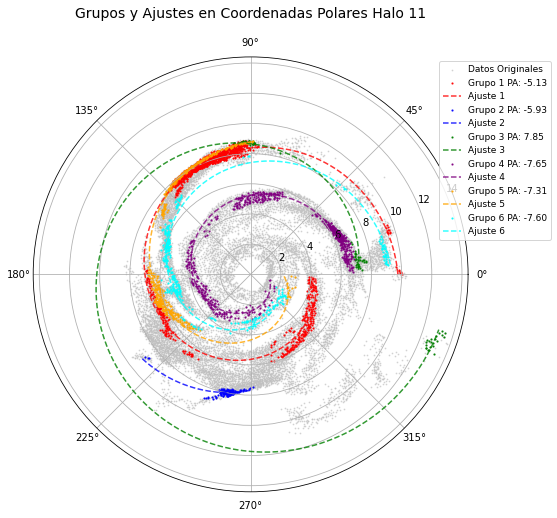

In [31]:
# Graficar en coordenadas polares los ajustes y sus grupos
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 8))

# Graficar todos los puntos originales en coordenadas polares
theta_all = np.radians(df['theta'])
ax.scatter(theta_all, df['r'], s=0.6, alpha=0.6, color='silver', label='Datos Originales')

# Graficar cada grupo válido en coordenadas polares
for idx, group in enumerate(valid_groups):
    points = group['points']
    theta_group = np.radians(points['theta'])
    r_group = points['r']
    pa = group['pa']
    
    # Graficar puntos del grupo
    ax.scatter(theta_group, r_group, s=1.5, alpha=0.8, label=f'Grupo {idx+1} PA: {pa:.2f}', color=colors[idx % len(colors)])
    
    # Graficar el ajuste lineal como una línea en coordenadas polares
    theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
    r_line = group['slope'] * theta_line + group['intercept']
    ax.plot(np.radians(theta_line), r_line, linestyle='--', linewidth=1.5, alpha=0.8, label=f'Ajuste {idx+1}', color=colors[idx % len(colors)])

# Configuración de la gráfica en coordenadas polares
ax.set_title("Grupos y Ajustes en Coordenadas Polares Halo 11", fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0), fontsize=9)
plt.show()


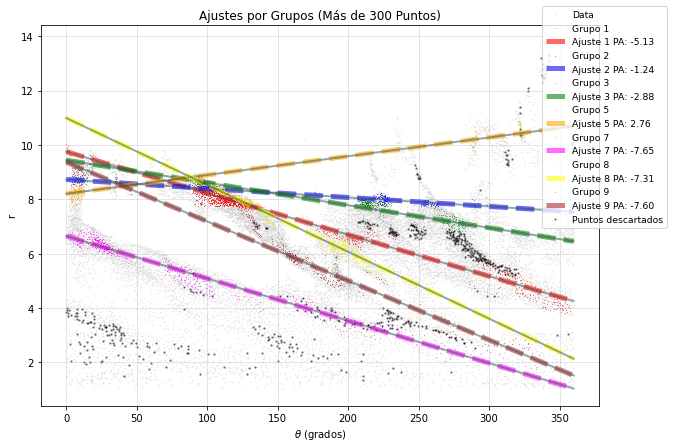

In [32]:

# Graficar ajustes (grupos con más de N=300 puntos)
N = len(df) / 100
plt.figure(figsize=(10, 7))

colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']
plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')

for idx, group in enumerate(groups):
    if len(group['points']) > N:
        points = group['points']
        slope = group['slope']
        intercept = group['intercept']
        pa = group['pa']

        plt.scatter(points['theta'], points['r'], s=0.980, alpha=0.49, linewidths=0.12,
                    label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

        theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
        r_line = slope * theta_line + intercept
        plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.59, label=f'Ajuste {idx+1} PA: {pa:.2f}', color=colors[idx % len(colors)])
        plt.plot(theta_line, r_line, linestyle='-', linewidth=2.03, alpha=0.50, color='darkslategray')

# Graficar puntos descartados
if not discarded_points_df.empty:
    plt.scatter(discarded_points_df['theta'], discarded_points_df['r'], s=2, alpha=0.365, color='black', label='Puntos descartados')

plt.title("Ajustes por Grupos (Más de 300 Puntos)")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(0.8902, 1.062), fontsize=9.3)
plt.grid(True, alpha=0.4)
plt.show()



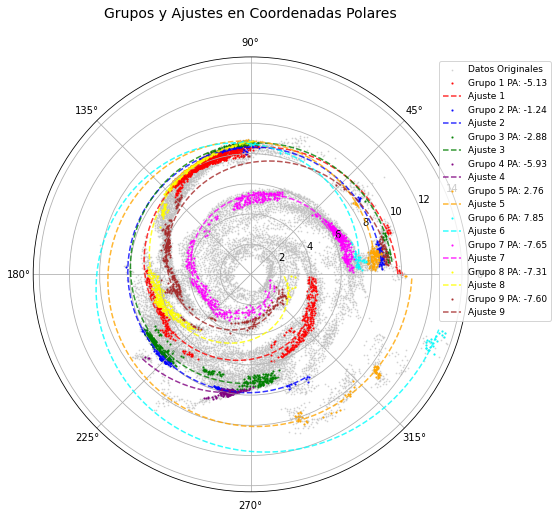

In [33]:

# Graficar en coordenadas polares los ajustes y sus grupos
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 8))

# Graficar todos los puntos originales en coordenadas polares
theta_all = np.radians(df['theta'])
ax.scatter(theta_all, df['r'], s=0.6, alpha=0.6, color='silver', label='Datos Originales')

# Graficar cada grupo válido en coordenadas polares
for idx, group in enumerate(groups):
    points = group['points']
    theta_group = np.radians(points['theta'])
    r_group = points['r']
    pa = group['pa']

    # Graficar puntos del grupo
    ax.scatter(theta_group, r_group, s=1.5, alpha=0.8, label=f'Grupo {idx+1} PA: {pa:.2f}', color=colors[idx % len(colors)])

    # Graficar el ajuste lineal como una línea en coordenadas polares
    theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
    r_line = group['slope'] * theta_line + group['intercept']
    ax.plot(np.radians(theta_line), r_line, linestyle='--', linewidth=1.5, alpha=0.8, label=f'Ajuste {idx+1}', color=colors[idx % len(colors)])

# Configuración de la gráfica en coordenadas polares
ax.set_title("Grupos y Ajustes en Coordenadas Polares", fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0), fontsize=9)
plt.show()

## mas o menos working+

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Supongamos que ya tienes un DataFrame llamado `df` con las columnas `x`, `y`, y `rho_resta_final_exp`.

# Convertir a coordenadas polares
df['r'] = np.sqrt(df['x']**2 + df['y']**2)
df['theta'] = np.degrees(np.arctan2(df['y'], df['x']))
df['theta'] = np.where(df['theta'] < 0, df['theta'] + 360, df['theta'])

# Filtrar puntos por el cuartil 85%
threshold = df['rho_resta_final_exp'].quantile(0.85)
df_filtered = df[df['rho_resta_final_exp'] > threshold].sort_values(by='rho_resta_final_exp', ascending=False).reset_index(drop=True)

# DBSCAN en coordenadas cartesianas
X_cartesian = df_filtered[['x', 'y']].values

# Parámetros de DBSCAN
eps = 0.198
min_samples = 18
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
df_filtered['cluster'] = dbscan.fit_predict(X_cartesian)

# Transformar los clusters al espacio polar
clusters_polar = {}
for cluster_id in np.unique(df_filtered['cluster']):
    if cluster_id == -1:  # Ignorar puntos de ruido
        continue
    cluster_points = df_filtered[df_filtered['cluster'] == cluster_id]
    clusters_polar[cluster_id] = cluster_points[['r', 'theta']]

# Visualizar los clusters transformados al espacio polar
plt.figure(figsize=(10, 7))
for cluster_id, cluster_points in clusters_polar.items():
    plt.scatter(cluster_points['theta'], cluster_points['r'], label=f'Cluster {cluster_id}', s=10)

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title(f"Clusters Transformados al Espacio Polar")
plt.xlabel(r"$\theta$ (grados)")
plt.ylabel("r")
plt.legend()
plt.grid(alpha=0.5)
plt.show()

# Preparar los grupos iniciales para ajustes iterativos
groups = []
for cluster_id, cluster_points in clusters_polar.items():
    groups.append({
        'cluster_id': cluster_id,
        'points': cluster_points
    })

# Los grupos ahora están listos para el ajuste iterativo.
print(f"Grupos iniciales preparados: {len(groups)} clusters identificados.")

/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:108: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



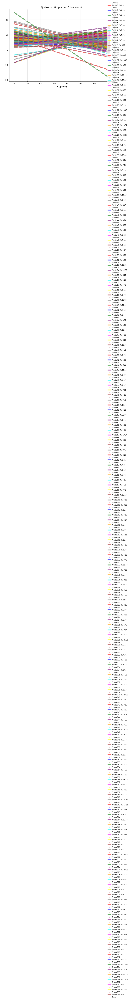

In [43]:
# Funciones auxiliares
def calculate_distance(slope, intercept, theta, r):
    predicted_r = slope * theta + intercept
    return abs(predicted_r - r)

def calculate_pa(slope, intercept):
    """Calcula el Position Angle (PA) en grados."""
    if intercept != 0:
        return np.degrees(np.arctan((slope * (180 / np.pi)) / intercept))
    return np.nan  # Evitar divisiones por cero

def is_valid_pa(pa, valid_range):
    return valid_range[0] <= abs(pa) <= valid_range[1]

# Inicializar variables
radius_tolerance = 0.55  # Radio de tolerancia alrededor del ajuste
point_distance_tolerance = 0.85  # Tolerancia para distancia entre puntos del grupo
flexible_pa_range = (4.0, 30.0)  # Rango de PA ajustado
discarded_points = []  # Lista para puntos descartados

# Generar ajustes iterativos
while len(df_filtered) >= 3:
    # Seleccionar los primeros tres puntos
    initial_points = df_filtered.iloc[:3]
    df_filtered = df_filtered.iloc[3:]

    X = initial_points[['theta']].values
    y = initial_points['r'].values

    # Ajustar modelo lineal
    model = LinearRegression()
    model.fit(X, y)
    slope = model.coef_[0]
    intercept = model.intercept_
    pa = calculate_pa(slope, intercept)

    # Validar el PA antes de agregar puntos al grupo
    if not is_valid_pa(pa, flexible_pa_range):
        discarded_points.extend(initial_points.to_dict('records'))
        continue

    # Crear grupo inicial y validar si pertenece a un ajuste existente
    assigned_to_group = False
    for group in groups:
        if 'slope' in group and 'intercept' in group:
            # Si el grupo tiene más de 30 puntos, extrapolar su ajuste
            if len(group['points']) > 30:
                theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
                r_line = group['slope'] * theta_line + group['intercept']
                distance_to_group = calculate_distance(group['slope'], group['intercept'], initial_points['theta'].mean(), initial_points['r'].mean())
            else:
                # Evaluar solo el grupo central
                distance_to_group = calculate_distance(group['slope'], group['intercept'], initial_points['theta'].mean(), initial_points['r'].mean())

            if distance_to_group <= radius_tolerance:
                # Verificar la distancia entre puntos del grupo
                distances = group['points'].apply(
                    lambda row: calculate_distance(group['slope'], group['intercept'], row['theta'], row['r']), axis=1)
                if all(distances <= point_distance_tolerance):
                    # Recalcular y validar el PA
                    X_new = np.vstack([group['points'][['theta']].values, X])
                    y_new = np.hstack([group['points']['r'].values, y])
                    model.fit(X_new, y_new)
                    new_slope = model.coef_[0]
                    new_intercept = model.intercept_
                    new_pa = calculate_pa(new_slope, new_intercept)

                    if is_valid_pa(new_pa, flexible_pa_range):
                        group['points'] = pd.concat([group['points'], initial_points], ignore_index=True)
                        group['slope'] = new_slope
                        group['intercept'] = new_intercept
                        group['pa'] = new_pa
                        assigned_to_group = True
                        break

    if not assigned_to_group:
        # Crear un nuevo grupo si no pertenece a un ajuste existente
        groups.append({'points': initial_points, 'slope': slope, 'intercept': intercept, 'pa': pa})

# Procesar puntos descartados
discarded_points_df = pd.DataFrame(discarded_points)
if not discarded_points_df.empty:
    for _, point in discarded_points_df.iterrows():
        theta_next = point['theta']
        r_next = point['r']
        assigned_to_group = False

        for group in groups:
            if 'slope' in group and 'intercept' in group:
                # Si el grupo tiene más de 30 puntos, extrapolar su ajuste
                if len(group['points']) > 30:
                    theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
                    r_line = group['slope'] * theta_line + group['intercept']
                    distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)
                else:
                    # Evaluar solo el grupo central
                    distance_to_group = calculate_distance(group['slope'], group['intercept'], theta_next, r_next)

                if distance_to_group <= radius_tolerance:
                    # Validar PA antes de agregar al grupo
                    pa = calculate_pa(group['slope'], group['intercept'])
                    if is_valid_pa(pa, flexible_pa_range):
                        # Agregar el punto al grupo existente
                        X_new = np.vstack([group['points'][['theta']].values, [[theta_next]]])
                        y_new = np.hstack([group['points']['r'].values, r_next])
                        model.fit(X_new, y_new)

                        group['points'] = pd.concat([group['points'], point.to_frame().T], ignore_index=True)
                        group['slope'] = model.coef_[0]
                        group['intercept'] = model.intercept_
                        group['pa'] = calculate_pa(group['slope'], group['intercept'])
                        assigned_to_group = True
                        break

        if not assigned_to_group:
            # Crear un nuevo grupo para el punto descartado si no pertenece a ningún ajuste
            new_group = pd.DataFrame([point])
            X_new = new_group[['theta']].values
            y_new = new_group['r'].values

            model.fit(X_new, y_new)
            new_slope = model.coef_[0]
            new_intercept = model.intercept_
            new_pa = calculate_pa(new_slope, new_intercept)

            if is_valid_pa(new_pa, flexible_pa_range):
                groups.append({
                    'points': new_group,
                    'slope': new_slope,
                    'intercept': new_intercept,
                    'pa': new_pa
                })

# Filtrar grupos válidos antes de graficar
valid_groups = [group for group in groups if 'slope' in group and 'intercept' in group and is_valid_pa(group['pa'], flexible_pa_range)]

# Graficar ajustes
plt.figure(figsize=(10, 7))
colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']

for idx, group in enumerate(valid_groups):
    points = group['points']
    slope = group['slope']
    intercept = group['intercept']
    pa = group['pa']

    plt.scatter(points['theta'], points['r'], s=15.80, alpha=0.46, edgecolor='red', linewidths=0.12,
                label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

    theta_line = np.linspace(df['theta'].min(), df['theta'].max(), 1000)
    r_line = slope * theta_line + intercept
    plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.58, label=f'Ajuste {idx+1} PA:{pa:.2f}', color=colors[idx % len(colors)])
    plt.plot(theta_line, r_line, linestyle='-', linewidth=2.03, alpha=0.48, color='gray')

plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')
plt.title("Ajustes por Grupos con Extrapolación")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(0.92, 1.12), fontsize=8.3)
plt.grid(True, alpha=0.4)
plt.show()




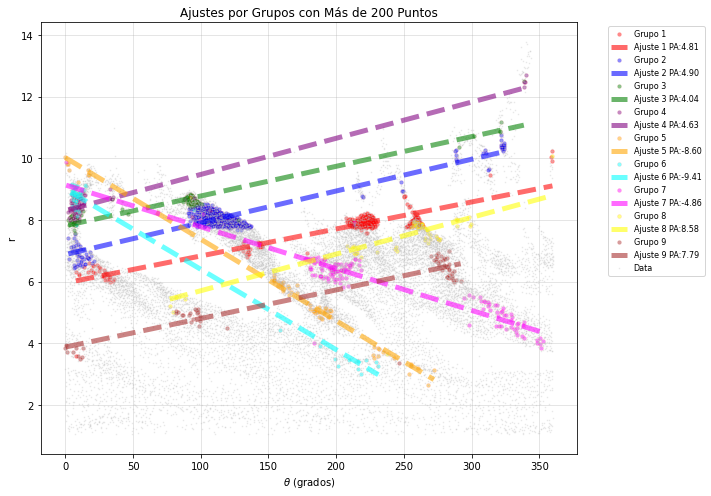

In [44]:
# Filtrar grupos con más de 200 puntos
large_groups = [group for group in valid_groups if len(group['points']) > 50]

# Graficar ajustes
plt.figure(figsize=(10, 7))
colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'gray']

for idx, group in enumerate(large_groups):
    points = group['points']
    slope = group['slope']
    intercept = group['intercept']
    pa = group['pa']

    # Graficar puntos del grupo
    plt.scatter(points['theta'], points['r'], s=15.80, alpha=0.46, edgecolor='red', linewidths=0.12,
                label=f'Grupo {idx+1}', color=colors[idx % len(colors)])

    # Graficar la línea de ajuste
    theta_line = np.linspace(points['theta'].min(), points['theta'].max(), 1000)
    r_line = slope * theta_line + intercept
    plt.plot(theta_line, r_line, linestyle='--', linewidth=5, alpha=0.58, label=f'Ajuste {idx+1} PA:{pa:.2f}', color=colors[idx % len(colors)])

# Graficar todos los datos como fondo
plt.scatter(df['theta'], df['r'], s=0.36, alpha=0.314, color='silver', label='Data')

# Configuración de la gráfica
plt.title("Ajustes por Grupos con Más de 200 Puntos")
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1.0), fontsize=8)
plt.grid(True, alpha=0.4)
plt.tight_layout()
plt.show()

## brazo 1

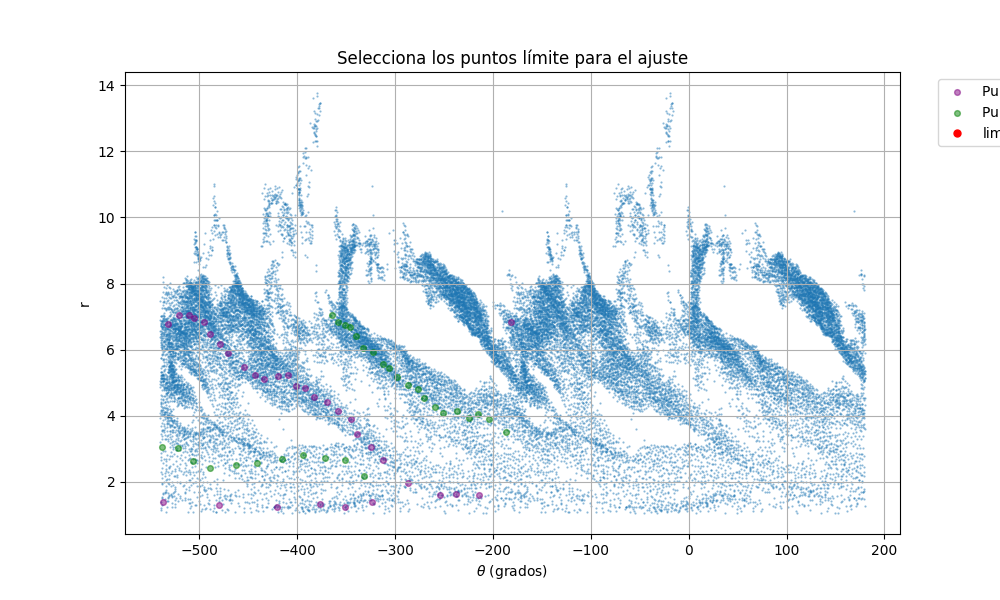

In [6]:
id_arm = 1
%matplotlib widget

# Visualizar los puntos y permitir la selección manual
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(data_combined['theta'], data_combined['r'], s=0.30, alpha=0.5)
ax.set_title("Selecciona los puntos límite para el ajuste")
ax.set_xlabel(r'$\theta$ (grados)')
# Graficar arm1_data y arm2_data como puntos de fondo
ax.scatter(arm1_data['theta'], arm1_data['r'], color='purple', alpha=0.5, s=17, label='Puntos de arm1_data')
ax.scatter(arm2_data['theta'], arm2_data['r'], color='green', alpha=0.5, s=17, label='Puntos de arm2_data')

ax.set_ylabel('r')
plt.grid(True)

# Usar mpl_point_clicker para seleccionar los límites
klicker = clicker(ax, ["limits"], markers=["o"], colors=['red'], markersize=5)

plt.show()

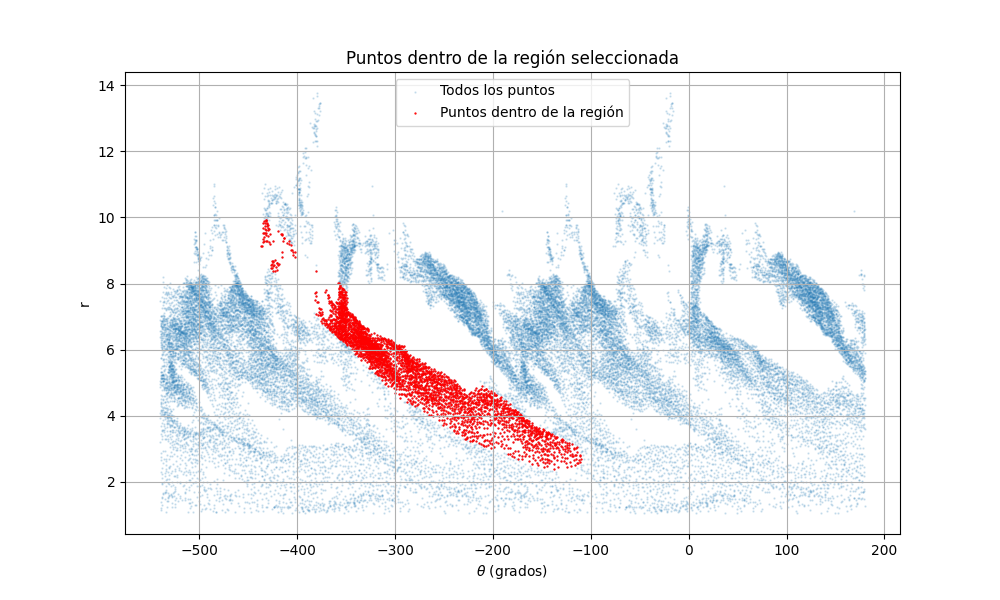

In [7]:
from matplotlib.path import Path

# Obtener los límites seleccionados
dict_lims = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims and len(dict_lims["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points = []
    for i in range(len(data_combined)):
        point = (data_combined['theta'].iloc[i], data_combined['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points.append(point)

    # Convertir los puntos seleccionados a DataFrame
    selected_data = pd.DataFrame(inside_points, columns=['theta', 'r'])

    # Graficar los puntos dentro de la región seleccionada
    plt.figure(figsize=(10, 6))
    plt.scatter(data_combined['theta'], data_combined['r'], s=0.40, alpha=0.2, label='Todos los puntos')
    plt.scatter(selected_data['theta'], selected_data['r'], color='red', s=0.40, label='Puntos dentro de la región')
    plt.title("Puntos dentro de la región seleccionada")
    plt.xlabel(r'$\theta$ (grados)')
    plt.ylabel('r')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")

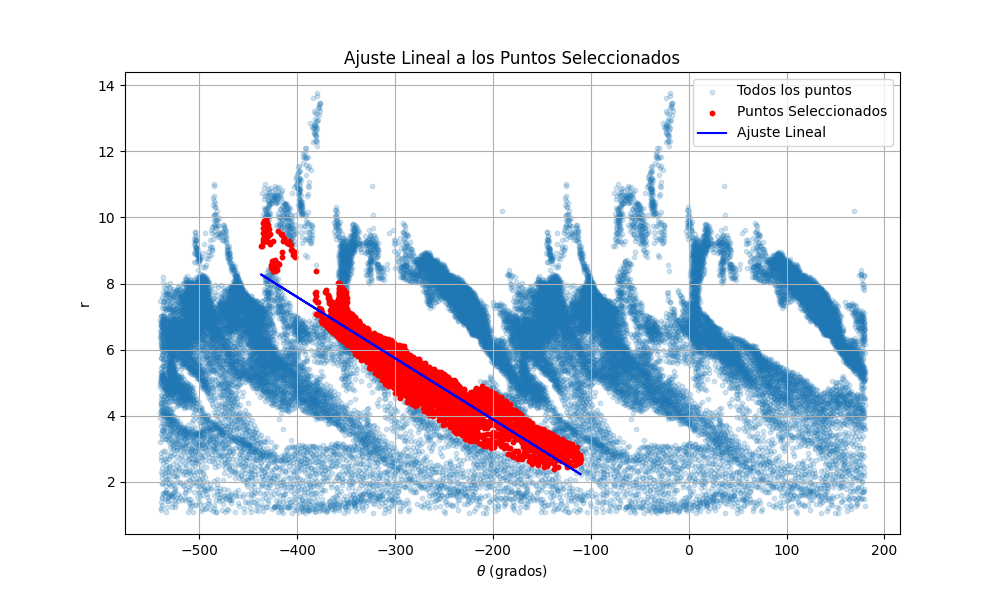

Ecuación de la recta ajustada: r = -0.0185 * θ + 0.1792 para el brazo1


In [9]:
# Obtener los límites seleccionados
dict_lims = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims and len(dict_lims["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points = []
    original_coords_arm1 = []  # Lista para almacenar las coordenadas originales seleccionadas
    for i in range(len(data_combined)):
        point = (data_combined['theta'].iloc[i], data_combined['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points.append(point)
            # Guardar las coordenadas originales en `x` e `y` para la gráfica polar
            original_coords_arm1.append((data['x'].iloc[i % len(data)], data['y'].iloc[i % len(data)]))

    # Convertir los puntos seleccionados a DataFrame
    selected_data = pd.DataFrame(inside_points, columns=['theta', 'r'])

    # Realizar ajuste lineal
    if len(selected_data) > 1:
        X_selected = selected_data[['theta']].values
        y_selected = selected_data['r'].values

        # Ajuste lineal
        model = LinearRegression()
        model.fit(X_selected, y_selected)
        slope_arm1 = model.coef_[0]
        intercept_arm1 = model.intercept_
        y_pred_arm1 = model.predict(X_selected)

        # Graficar los puntos seleccionados, la línea ajustada y el fondo
        plt.figure(figsize=(10, 6))
        plt.scatter(data_combined['theta'], data_combined['r'], s=10, alpha=0.2, label='Todos los puntos')
        plt.scatter(selected_data['theta'], selected_data['r'], color='red', s=10, label='Puntos Seleccionados')
        plt.plot(selected_data['theta'], y_pred_arm1, color='blue', label='Ajuste Lineal')
        plt.title("Ajuste Lineal a los Puntos Seleccionados")
        plt.xlabel(r'$\theta$ (grados)')
        plt.ylabel('r')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Mostrar la ecuación de la recta
        print(f"Ecuación de la recta ajustada: r = {slope_arm1:.4f} * θ + {intercept_arm1:.4f} para el brazo{id_arm}")
    else:
        print("Selecciona más puntos para realizar el ajuste.")
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")
save_dict_as_csv(dict_lims, "dict_lims.csv")



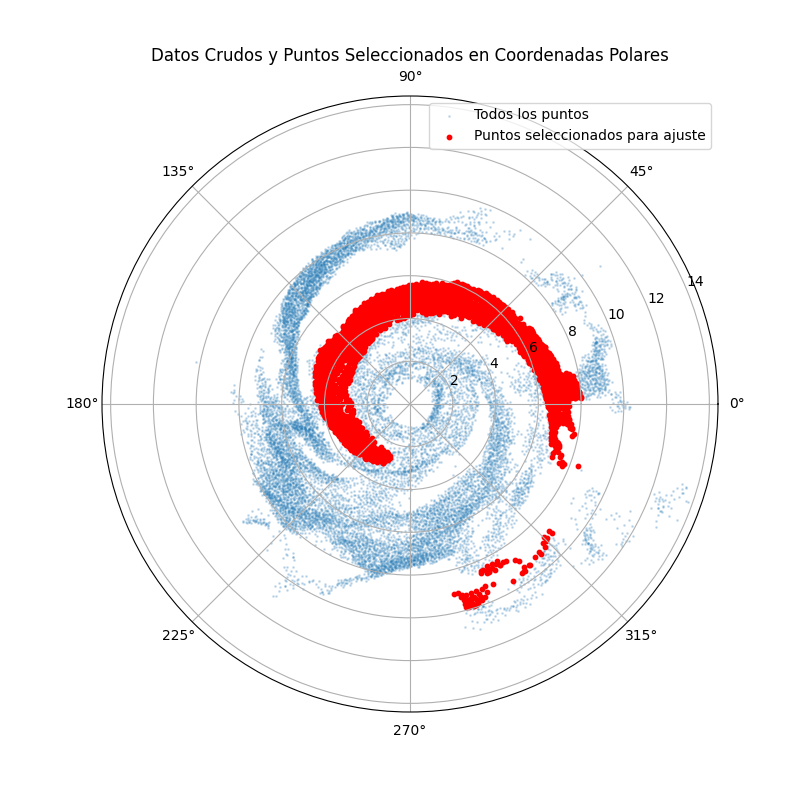

In [10]:
# Extraer las coordenadas originales x e y de los puntos seleccionados
selected_x = [coord[0] for coord in original_coords_arm1]
selected_y = [coord[1] for coord in original_coords_arm1]

# Configurar la gráfica en coordenadas polares
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 8))

# Graficar todos los puntos en coordenadas polares
theta_all = np.arctan2(data['y'], data['x'])
r_all = np.sqrt(data['x']**2 + data['y']**2)
ax.scatter(theta_all, r_all, s=1, alpha=0.2, label="Todos los puntos")

# Graficar solo los puntos seleccionados en rojo
theta_selected = np.arctan2(selected_y, selected_x)
r_selected = np.sqrt(np.array(selected_x)**2 + np.array(selected_y)**2)
ax.scatter(theta_selected, r_selected, color='red', s=10, label="Puntos seleccionados para ajuste")

# Configuración de la gráfica
ax.set_title("Datos Crudos y Puntos Seleccionados en Coordenadas Polares")
ax.legend()
plt.show()


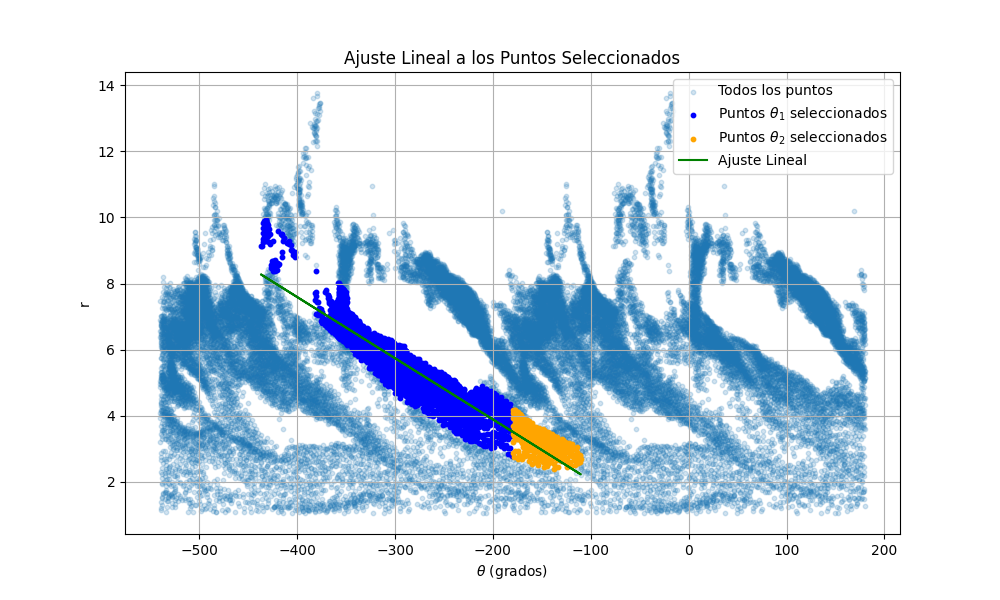

Ecuación de la recta ajustada: r = -0.0185 * θ + 0.1792


In [11]:
# Obtener los límites seleccionados
dict_lims = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims and len(dict_lims["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points_theta1 = []
    inside_points_theta2 = []
    original_coords_theta1 = []  # Para almacenar las coordenadas originales de theta1
    original_coords_theta2 = []  # Para almacenar las coordenadas originales de theta2
    
    # Iterar sobre los puntos de theta1
    for i in range(len(data_theta1)):
        point = (data_theta1['theta'].iloc[i], data_theta1['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points_theta1.append(point)
            original_coords_theta1.append((data['x'].iloc[i], data['y'].iloc[i]))

    # Iterar sobre los puntos de theta2
    for i in range(len(data_theta2)):
        point = (data_theta2['theta'].iloc[i], data_theta2['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points_theta2.append(point)
            original_coords_theta2.append((data['x'].iloc[i], data['y'].iloc[i]))

    # Convertir los puntos seleccionados a DataFrame
    selected_data_theta1 = pd.DataFrame(inside_points_theta1, columns=['theta', 'r'])
    selected_data_theta2 = pd.DataFrame(inside_points_theta2, columns=['theta', 'r'])

    # Concatenar ambos para el ajuste lineal (si quieres usar todos los puntos seleccionados)
    selected_data = pd.concat([selected_data_theta1, selected_data_theta2], ignore_index=True)

    # Realizar ajuste lineal
    if len(selected_data) > 1:
        X_selected = selected_data[['theta']].values
        y_selected = selected_data['r'].values

        # Ajuste lineal
        model = LinearRegression()
        model.fit(X_selected, y_selected)
        slope = model.coef_[0]
        intercept = model.intercept_
        y_pred = model.predict(X_selected)

        # Graficar los puntos seleccionados, la línea ajustada y el fondo
        plt.figure(figsize=(10, 6))
        plt.scatter(data_combined['theta'], data_combined['r'], s=10, alpha=0.2, label='Todos los puntos')
        plt.scatter(selected_data_theta1['theta'], selected_data_theta1['r'], color='blue', s=10, label=r'Puntos $\theta_1$ seleccionados')
        plt.scatter(selected_data_theta2['theta'], selected_data_theta2['r'], color='orange', s=10, label=r'Puntos $\theta_2$ seleccionados')
        plt.plot(selected_data['theta'], y_pred, color='green', label='Ajuste Lineal')
        plt.title("Ajuste Lineal a los Puntos Seleccionados")
        plt.xlabel(r'$\theta$ (grados)')
        plt.ylabel('r')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Mostrar la ecuación de la recta
        print(f"Ecuación de la recta ajustada: r = {slope:.4f} * θ + {intercept:.4f}")
    else:
        print("Selecciona más puntos para realizar el ajuste.")
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")


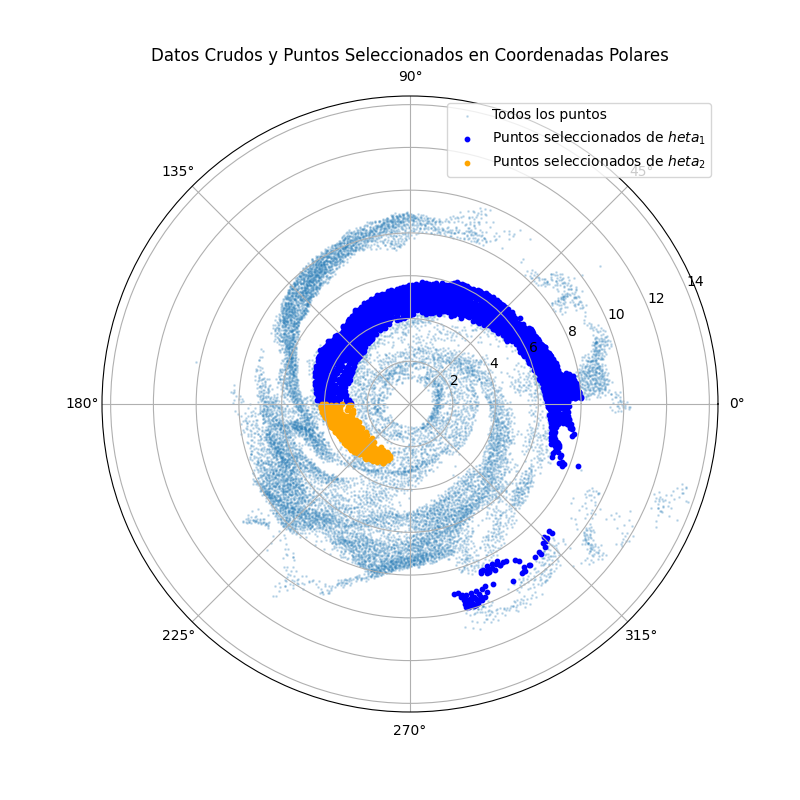

In [12]:
# Extraer las coordenadas originales x e y de los puntos seleccionados
selected_x_theta1 = [coord[0] for coord in original_coords_theta1]
selected_y_theta1 = [coord[1] for coord in original_coords_theta1]
selected_x_theta2 = [coord[0] for coord in original_coords_theta2]
selected_y_theta2 = [coord[1] for coord in original_coords_theta2]

# Configurar la gráfica en coordenadas polares
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 8))

# Graficar todos los puntos en coordenadas polares
theta_all = np.arctan2(data['y'], data['x'])
r_all = np.sqrt(data['x']**2 + data['y']**2)
ax.scatter(theta_all, r_all, s=1, alpha=0.2, label="Todos los puntos")

# Graficar los puntos seleccionados de theta1 en azul
theta_selected_theta1 = np.arctan2(selected_y_theta1, selected_x_theta1)
r_selected_theta1 = np.sqrt(np.array(selected_x_theta1)**2 + np.array(selected_y_theta1)**2)
ax.scatter(theta_selected_theta1, r_selected_theta1, color='blue', s=10, label="Puntos seleccionados de $\theta_1$")

# Graficar los puntos seleccionados de theta2 en naranja
theta_selected_theta2 = np.arctan2(selected_y_theta2, selected_x_theta2)
r_selected_theta2 = np.sqrt(np.array(selected_x_theta2)**2 + np.array(selected_y_theta2)**2)
ax.scatter(theta_selected_theta2, r_selected_theta2, color='orange', s=10, label="Puntos seleccionados de $\theta_2$")

# Configuración de la gráfica
ax.set_title("Datos Crudos y Puntos Seleccionados en Coordenadas Polares")
ax.legend()
plt.show()


## brazo 2

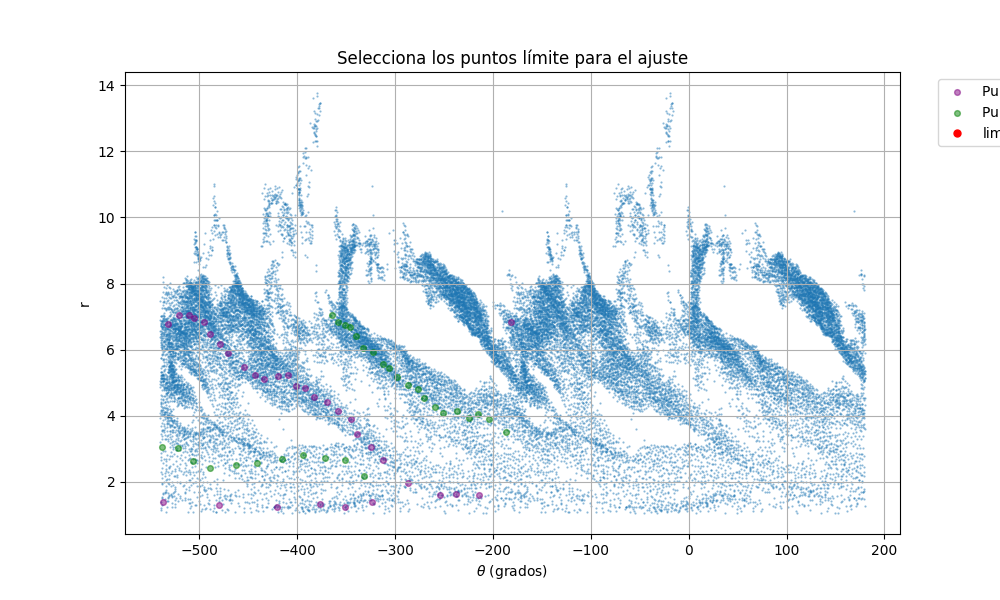

In [13]:
id_arm = 2
%matplotlib widget

# Visualizar los puntos y permitir la selección manual
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(data_combined['theta'], data_combined['r'], s=0.30, alpha=0.5)
ax.set_title("Selecciona los puntos límite para el ajuste")
ax.set_xlabel(r'$\theta$ (grados)')
# Graficar arm1_data y arm2_data como puntos de fondo
ax.scatter(arm1_data['theta'], arm1_data['r'], color='purple', alpha=0.5, s=17, label='Puntos de arm1_data')
ax.scatter(arm2_data['theta'], arm2_data['r'], color='green', alpha=0.5, s=17, label='Puntos de arm2_data')

ax.set_ylabel('r')
plt.grid(True)

# Usar mpl_point_clicker para seleccionar los límites
klicker = clicker(ax, ["limits"], markers=["o"], colors=['red'], markersize=5)

plt.show()

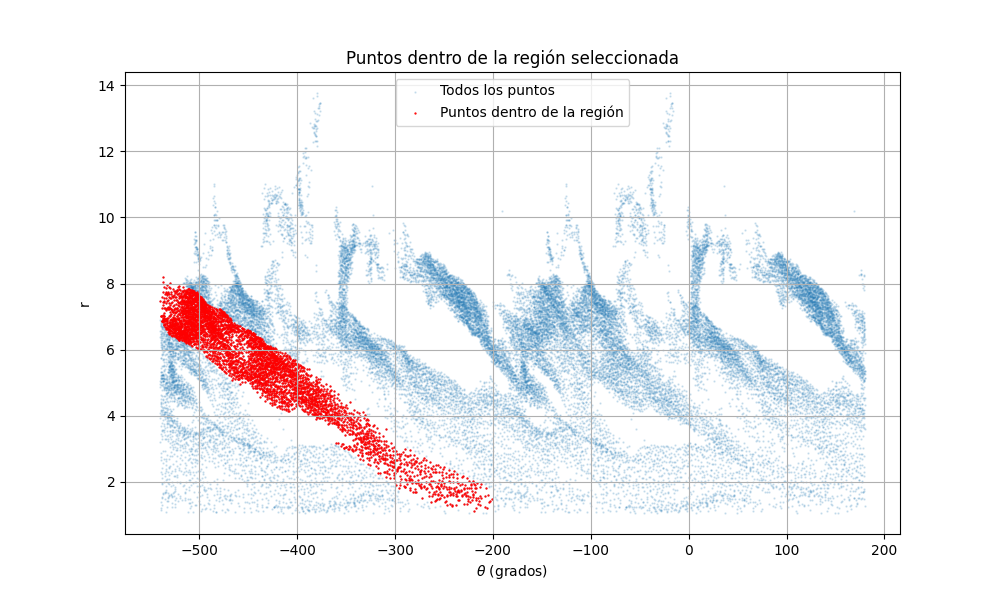

In [14]:
from matplotlib.path import Path

# Obtener los límites seleccionados
dict_lims_arm2_ = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims and len(dict_lims_arm2_["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims_arm2_["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points = []
    for i in range(len(data_combined)):
        point = (data_combined['theta'].iloc[i], data_combined['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points.append(point)

    # Convertir los puntos seleccionados a DataFrame
    selected_data = pd.DataFrame(inside_points, columns=['theta', 'r'])

    # Graficar los puntos dentro de la región seleccionada
    plt.figure(figsize=(10, 6))
    plt.scatter(data_combined['theta'], data_combined['r'], s=0.40, alpha=0.2, label='Todos los puntos')
    plt.scatter(selected_data['theta'], selected_data['r'], color='red', s=0.40, label='Puntos dentro de la región')
    plt.title("Puntos dentro de la región seleccionada")
    plt.xlabel(r'$\theta$ (grados)')
    plt.ylabel('r')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")

In [1]:
# Obtener los límites seleccionados
dict_lims_arm2 = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims_arm2 and len(dict_lims_arm2["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims_arm2["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points = []
    original_coords_arm2 = []  # Lista para almacenar las coordenadas originales seleccionadas
    for i in range(len(data_combined)):
        point = (data_combined['theta'].iloc[i], data_combined['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points.append(point)
            # Guardar las coordenadas originales en `x` e `y` para la gráfica polar
            original_coords_arm2.append((data['x'].iloc[i % len(data)], data['y'].iloc[i % len(data)]))

    # Convertir los puntos seleccionados a DataFrame
    selected_data_arm2 = pd.DataFrame(inside_points, columns=['theta', 'r'])

    # Realizar ajuste lineal
    if len(selected_data_arm2) > 1:
        X_selected = selected_data_arm2[['theta']].values
        y_selected = selected_data_arm2['r'].values

        # Ajuste lineal
        model = LinearRegression()
        model.fit(X_selected, y_selected)
        slope_arm2 = model.coef_[0]
        intercept_arm2 = model.intercept_
        y_pred_arm2 = model.predict(X_selected)

        # Graficar los puntos seleccionados, la línea ajustada y el fondo
        plt.figure(figsize=(10, 6))
        plt.scatter(data_combined['theta'], data_combined['r'], s=10, alpha=0.2, label='Todos los puntos')
        plt.scatter(selected_data_arm2['theta'], selected_data_arm2['r'], color='red', s=10, label='Puntos Seleccionados')
        plt.plot(selected_data_arm2['theta'], y_pred_arm2, color='blue', label='Ajuste Lineal')
        plt.title("Ajuste Lineal a los Puntos Seleccionados")
        plt.xlabel(r'$\theta$ (grados)')
        plt.ylabel('r')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Mostrar la ecuación de la recta
        print(f"Ecuación de la recta ajustada: r = {slope_arm2:.4f} * θ + {intercept_arm2:.4f} para el brazo{id_arm}")
    else:
        print("Selecciona más puntos para realizar el ajuste.")
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")

save_dict_as_csv(dict_lims_arm2, "dict_lims_arm2.csv")

NameError: name 'klicker' is not defined

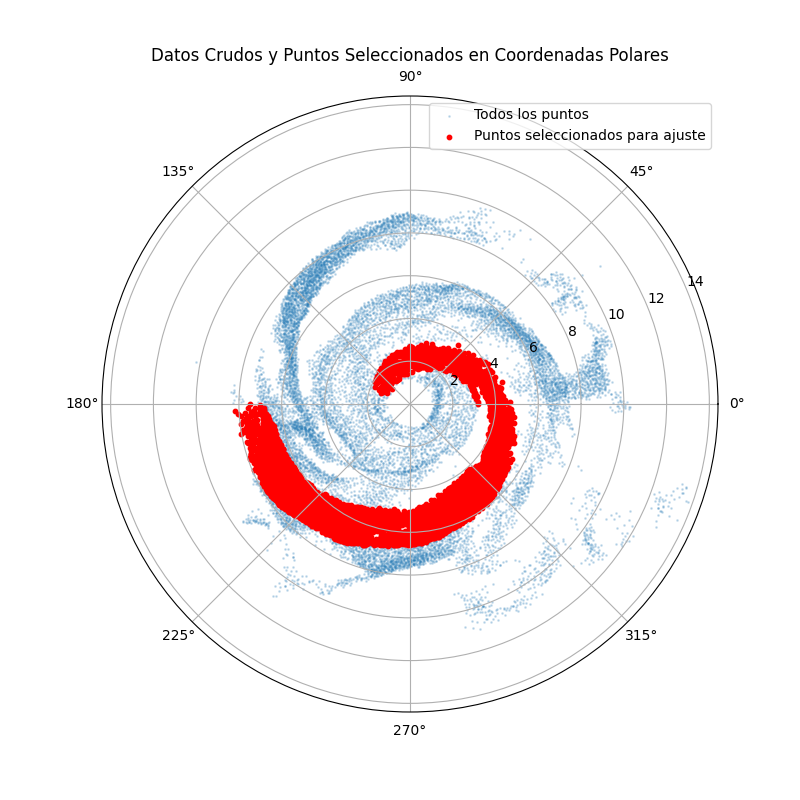

In [18]:
# Extraer las coordenadas originales x e y de los puntos seleccionados
selected_x = [coord[0] for coord in original_coords_arm2]
selected_y = [coord[1] for coord in original_coords_arm2]

# Configurar la gráfica en coordenadas polares
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 8))

# Graficar todos los puntos en coordenadas polares
theta_all = np.arctan2(data['y'], data['x'])
r_all = np.sqrt(data['x']**2 + data['y']**2)
ax.scatter(theta_all, r_all, s=1, alpha=0.2, label="Todos los puntos")

# Graficar solo los puntos seleccionados en rojo
theta_selected_arm_2 = np.arctan2(selected_y, selected_x)
r_selected_arm_2 = np.sqrt(np.array(selected_x)**2 + np.array(selected_y)**2)
ax.scatter(theta_selected_arm_2, r_selected_arm_2, color='red', s=10, label="Puntos seleccionados para ajuste")

# Configuración de la gráfica
ax.set_title("Datos Crudos y Puntos Seleccionados en Coordenadas Polares")
ax.legend()
plt.show()

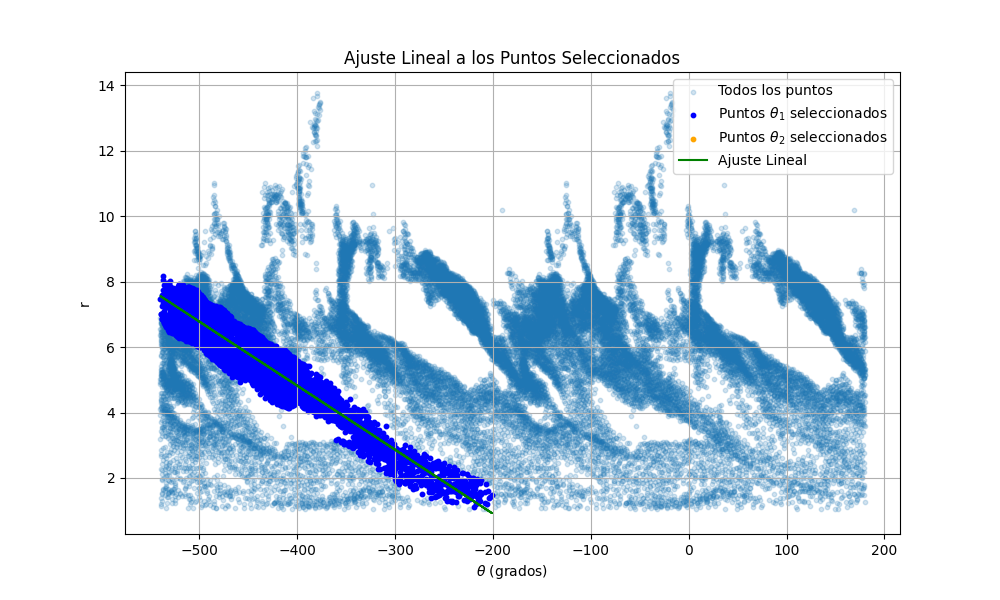

Ecuación de la recta ajustada: r = -0.0196 * θ + -3.0108


In [20]:
# Obtener los límites seleccionados
dict_lims_arm2 = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims and len(dict_lims_arm2["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims_arm2["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points_theta1 = []
    inside_points_theta2 = []
    original_coords_theta1 = []  # Para almacenar las coordenadas originales de theta1
    original_coords_theta2 = []  # Para almacenar las coordenadas originales de theta2
    
    # Iterar sobre los puntos de theta1
    for i in range(len(data_theta1)):
        point = (data_theta1['theta'].iloc[i], data_theta1['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points_theta1.append(point)
            original_coords_theta1.append((data['x'].iloc[i], data['y'].iloc[i]))

    # Iterar sobre los puntos de theta2
    for i in range(len(data_theta2)):
        point = (data_theta2['theta'].iloc[i], data_theta2['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points_theta2.append(point)
            original_coords_theta2.append((data['x'].iloc[i], data['y'].iloc[i]))

    # Convertir los puntos seleccionados a DataFrame
    # Convertir los puntos seleccionados de theta1 a DataFrame solo si hay puntos
    if inside_points_theta1:
        selected_data_theta1 = pd.DataFrame(inside_points_theta1, columns=['theta', 'r'])
    else:
        selected_data_theta1 = pd.DataFrame({'theta': pd.Series(dtype='float64'), 
                                             'r': pd.Series(dtype='float64')})  # Crear un DataFrame vacío con las columnas necesarias

    # Convertir los puntos seleccionados de theta2 a DataFrame solo si hay puntos
    if inside_points_theta2:
        selected_data_theta2 = pd.DataFrame(inside_points_theta2, columns=['theta', 'r'])
    else:
        selected_data_theta2 = pd.DataFrame({'theta': pd.Series(dtype='float64'), 
                                             'r': pd.Series(dtype='float64')})  # Crear un DataFrame vacío con las columnas necesarias

    # Concatenar ambos para el ajuste lineal (si quieres usar todos los puntos seleccionados)
    selected_data = pd.concat([selected_data_theta1, selected_data_theta2], ignore_index=True)

    # Realizar ajuste lineal
    if len(selected_data) > 1:
        X_selected = selected_data[['theta']].values
        y_selected = selected_data['r'].values

        # Ajuste lineal
        model = LinearRegression()
        model.fit(X_selected, y_selected)
        slope = model.coef_[0]
        intercept = model.intercept_
        y_pred = model.predict(X_selected)

        # Graficar los puntos seleccionados, la línea ajustada y el fondo
        plt.figure(figsize=(10, 6))
        plt.scatter(data_combined['theta'], data_combined['r'], s=10, alpha=0.2, label='Todos los puntos')
        plt.scatter(selected_data_theta1['theta'], selected_data_theta1['r'], color='blue', s=10, label=r'Puntos $\theta_1$ seleccionados')
        plt.scatter(selected_data_theta2['theta'], selected_data_theta2['r'], color='orange', s=10, label=r'Puntos $\theta_2$ seleccionados')
        plt.plot(selected_data['theta'], y_pred, color='green', label='Ajuste Lineal')
        plt.title("Ajuste Lineal a los Puntos Seleccionados")
        plt.xlabel(r'$\theta$ (grados)')
        plt.ylabel('r')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Mostrar la ecuación de la recta
        print(f"Ecuación de la recta ajustada: r = {slope:.4f} * θ + {intercept:.4f}")
    else:
        print("Selecciona más puntos para realizar el ajuste.")
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")


## brazo 3

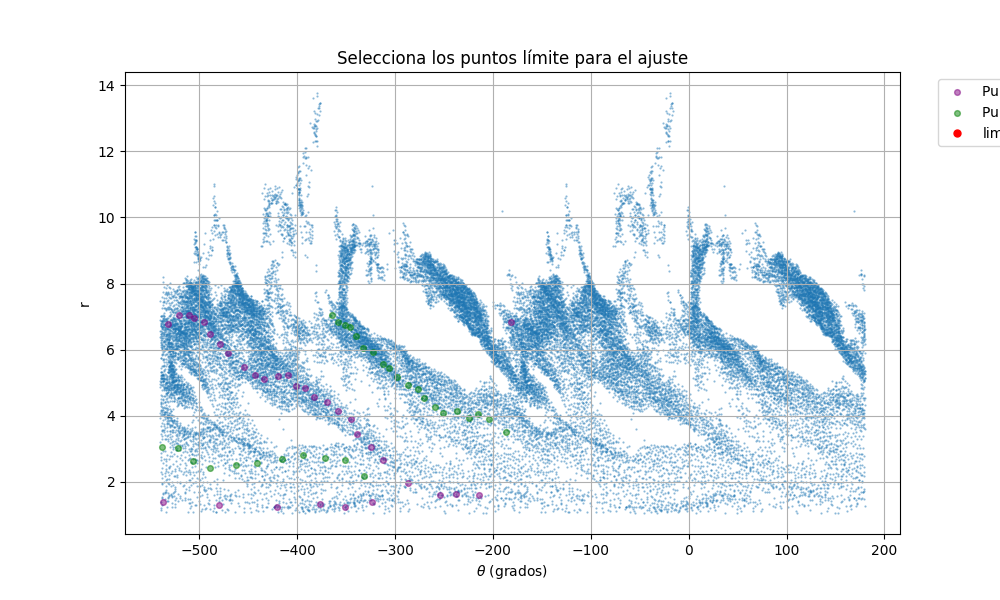

In [21]:
id_arm = 3
%matplotlib widget

# Visualizar los puntos y permitir la selección manual
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(data_combined['theta'], data_combined['r'], s=0.30, alpha=0.5)
ax.set_title("Selecciona los puntos límite para el ajuste")
ax.set_xlabel(r'$\theta$ (grados)')
# Graficar arm1_data y arm2_data como puntos de fondo
ax.scatter(arm1_data['theta'], arm1_data['r'], color='purple', alpha=0.5, s=17, label='Puntos de arm1_data')
ax.scatter(arm2_data['theta'], arm2_data['r'], color='green', alpha=0.5, s=17, label='Puntos de arm2_data')

ax.set_ylabel('r')
plt.grid(True)

# Usar mpl_point_clicker para seleccionar los límites
klicker = clicker(ax, ["limits"], markers=["o"], colors=['red'], markersize=5)

plt.show()

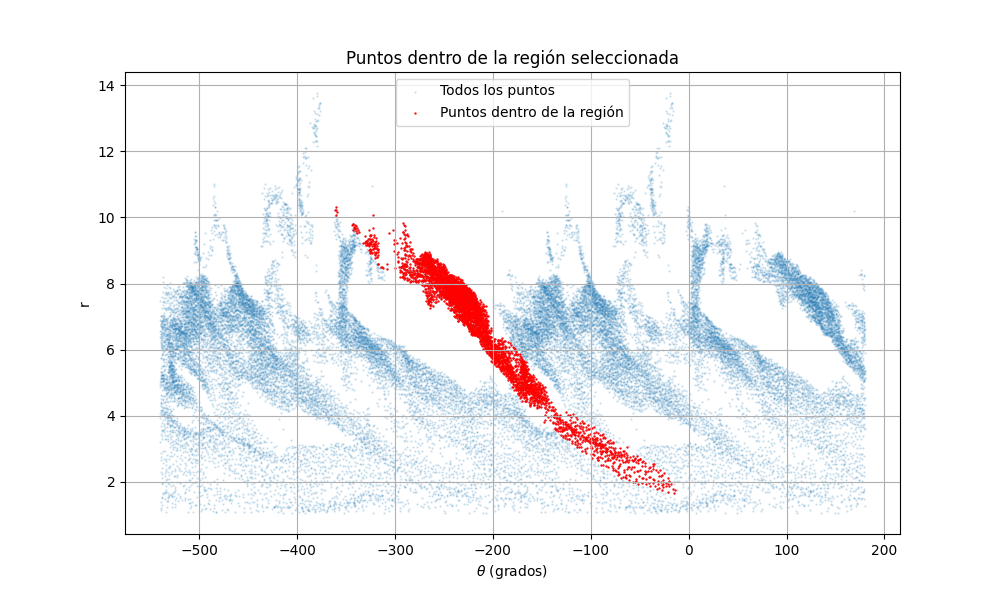

In [22]:
from matplotlib.path import Path

# Obtener los límites seleccionados
dict_lims_arm3 = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims_arm3 and len(dict_lims_arm3["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims_arm3["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points = []
    for i in range(len(data_combined)):
        point = (data_combined['theta'].iloc[i], data_combined['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points.append(point)

    # Convertir los puntos seleccionados a DataFrame
    selected_data = pd.DataFrame(inside_points, columns=['theta', 'r'])

    # Graficar los puntos dentro de la región seleccionada
    plt.figure(figsize=(10, 6))
    plt.scatter(data_combined['theta'], data_combined['r'], s=0.40, alpha=0.2, label='Todos los puntos')
    plt.scatter(selected_data['theta'], selected_data['r'], color='red', s=0.40, label='Puntos dentro de la región')
    plt.title("Puntos dentro de la región seleccionada")
    plt.xlabel(r'$\theta$ (grados)')
    plt.ylabel('r')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")

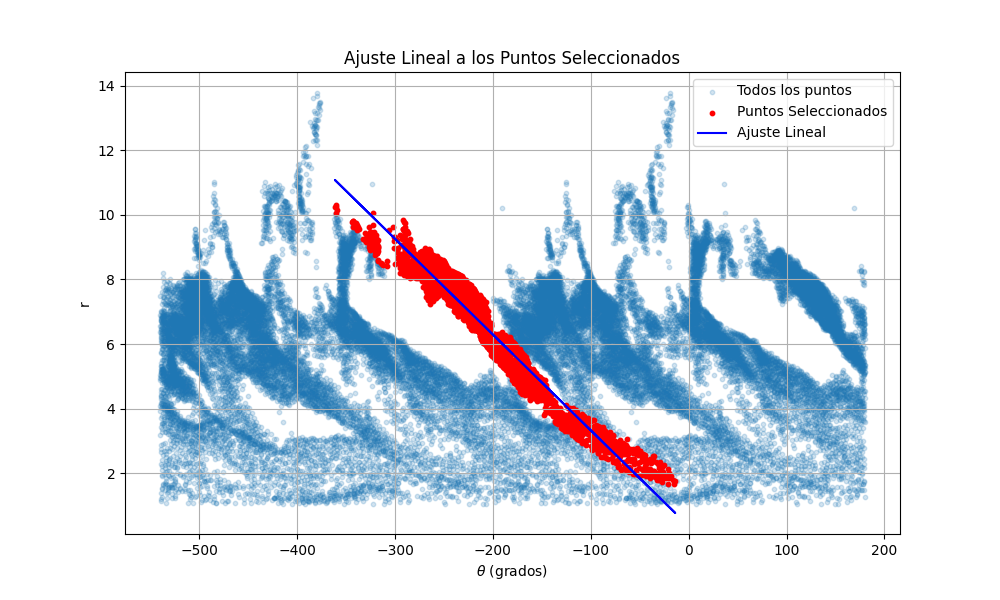

Ecuación de la recta ajustada: r = -0.0296 * θ + 0.3673 para el brazo 3


In [23]:
# Obtener los límites seleccionados
dict_lims_arm3 = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims_arm3 and len(dict_lims_arm3["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims_arm3["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points = []
    original_coords_arm3 = []  # Lista para almacenar las coordenadas originales seleccionadas
    for i in range(len(data_combined)):
        point = (data_combined['theta'].iloc[i], data_combined['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points.append(point)
            # Guardar las coordenadas originales en `x` e `y` para la gráfica polar
            original_coords_arm3.append((data['x'].iloc[i % len(data)], data['y'].iloc[i % len(data)]))

    # Convertir los puntos seleccionados a DataFrame
    selected_data_arm3 = pd.DataFrame(inside_points, columns=['theta', 'r'])

    # Realizar ajuste lineal
    if len(selected_data_arm3) > 1:
        X_selected = selected_data_arm3[['theta']].values
        y_selected = selected_data_arm3['r'].values

        # Ajuste lineal
        model = LinearRegression()
        model.fit(X_selected, y_selected)
        slope_arm3 = model.coef_[0]
        intercept_arm3 = model.intercept_
        y_pred_arm3 = model.predict(X_selected)

        # Graficar los puntos seleccionados, la línea ajustada y el fondo
        plt.figure(figsize=(10, 6))
        plt.scatter(data_combined['theta'], data_combined['r'], s=10, alpha=0.2, label='Todos los puntos')
        plt.scatter(selected_data_arm3['theta'], selected_data_arm3['r'], color='red', s=10, label='Puntos Seleccionados')
        plt.plot(selected_data_arm3['theta'], y_pred_arm3, color='blue', label='Ajuste Lineal')
        plt.title("Ajuste Lineal a los Puntos Seleccionados")
        plt.xlabel(r'$\theta$ (grados)')
        plt.ylabel('r')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Mostrar la ecuación de la recta
        print(f"Ecuación de la recta ajustada: r = {slope_arm3:.4f} * θ + {intercept_arm3:.4f} para el brazo {id_arm}")
    else:
        print("Selecciona más puntos para realizar el ajuste.")
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")

save_dict_as_csv(dict_lims_arm3, "dict_lims_arm3.csv")


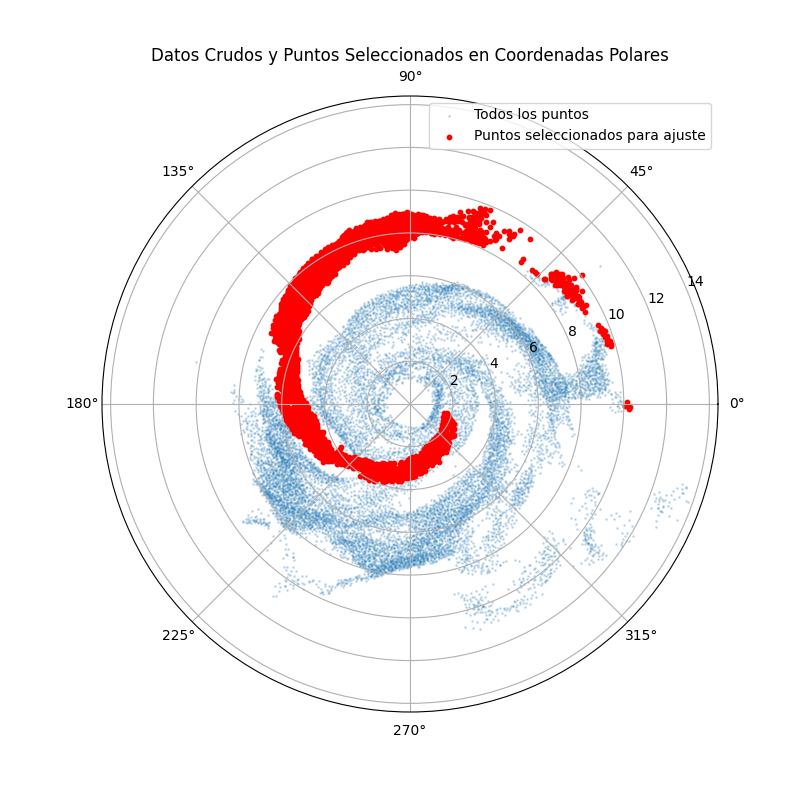

In [24]:
# Extraer las coordenadas originales x e y de los puntos seleccionados
selected_x = [coord[0] for coord in original_coords_arm3]
selected_y = [coord[1] for coord in original_coords_arm3]

# Configurar la gráfica en coordenadas polares
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 8))

# Graficar todos los puntos en coordenadas polares
theta_all = np.arctan2(data['y'], data['x'])
r_all = np.sqrt(data['x']**2 + data['y']**2)
ax.scatter(theta_all, r_all, s=1, alpha=0.2, label="Todos los puntos")

# Graficar solo los puntos seleccionados en rojo
theta_selected_arm_3 = np.arctan2(selected_y, selected_x)
r_selected_arm_3 = np.sqrt(np.array(selected_x)**2 + np.array(selected_y)**2)
ax.scatter(theta_selected_arm_3, r_selected_arm_3, color='red', s=10, label="Puntos seleccionados para ajuste")

# Configuración de la gráfica
ax.set_title("Datos Crudos y Puntos Seleccionados en Coordenadas Polares")
ax.legend()
plt.show()

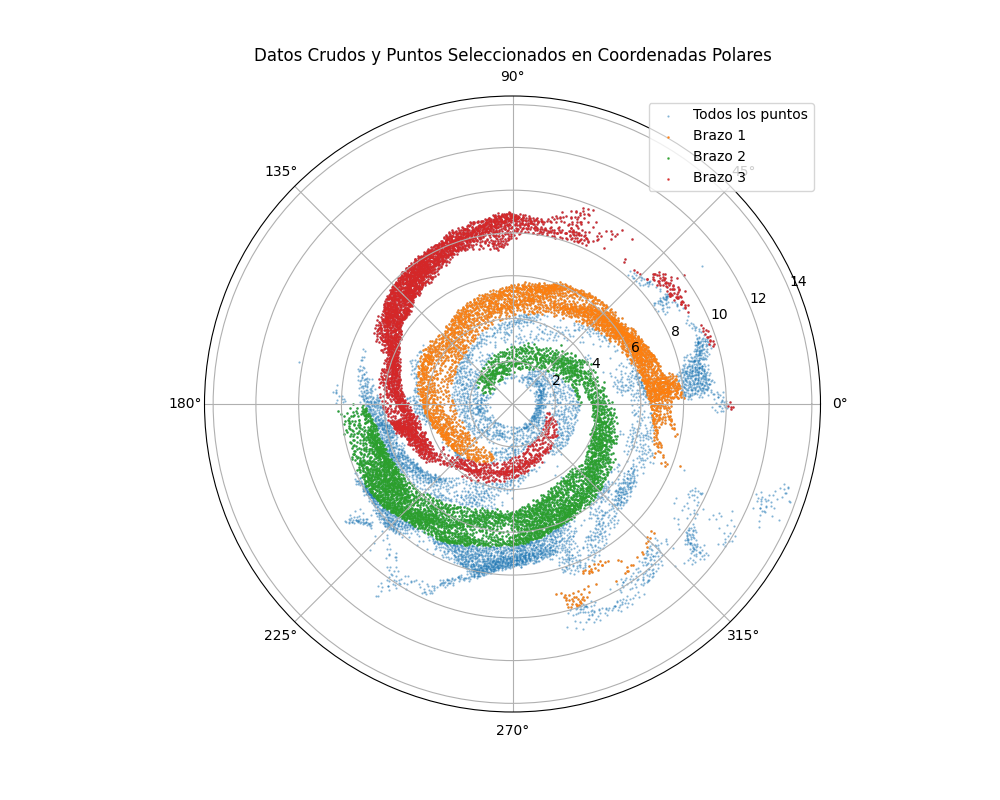


Datos para arm_1:
   theta_selected  r_selected
0        3.128995    2.770713
1        3.068084    2.852221
2        3.088414    2.842793
3        2.995416    3.008030
4        3.099993    3.007599

Datos para arm_2:
   theta_selected  r_selected
0        2.461159    1.105066
1        2.024850    1.309444
2        2.124652    1.280806
3        2.058868    1.273300
4        2.684854    1.195804

Datos para arm_3:
   theta_selected  r_selected
0        3.140194    5.252163
1        3.133245    4.875389
2        3.083423    5.495158
3        3.131310    5.343154
4        3.105684    5.022543


In [25]:
# Crear DataFrames para almacenar los datos de cada brazo
arms_data = {}

def guardar_datos_brazo(selected_x, selected_y, id_arm):
    """Almacenar los datos seleccionados para un brazo específico."""
    theta_selected = np.arctan2(selected_y, selected_x)
    r_selected = np.sqrt(np.array(selected_x)**2 + np.array(selected_y)**2)
    arms_data[f'arm_{id_arm}'] = pd.DataFrame({
        'theta_selected': theta_selected,
        'r_selected': r_selected
    })
    return theta_selected, r_selected

# Extraer las coordenadas originales x e y de los puntos seleccionados para cada brazo
def procesar_brazo(original_coords, id_arm, ax):
    """Procesar y graficar un brazo en la gráfica proporcionada."""
    selected_x = [coord[0] for coord in original_coords]
    selected_y = [coord[1] for coord in original_coords]
    theta_selected, r_selected = guardar_datos_brazo(selected_x, selected_y, id_arm)
    
    # Graficar los puntos seleccionados en el mismo eje
    ax.scatter(theta_selected, r_selected, s=0.72, alpha=0.82, label=f'Brazo {id_arm}')

# Configurar la gráfica en coordenadas polares
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 8))

# Graficar todos los puntos en coordenadas polares
theta_all = np.arctan2(data['y'], data['x'])
r_all = np.sqrt(data['x']**2 + data['y']**2)
ax.scatter(theta_all, r_all, s=0.32, alpha=0.52, label="Todos los puntos")

# Procesar los brazos seleccionados y graficarlos en la misma gráfica
procesar_brazo(original_coords_arm1, id_arm=1, ax=ax)
procesar_brazo(original_coords_arm2, id_arm=2, ax=ax)
procesar_brazo(original_coords_arm3, id_arm=3, ax=ax)

# Configuración de la gráfica
ax.set_title("Datos Crudos y Puntos Seleccionados en Coordenadas Polares")
ax.legend(loc='upper right')
plt.show()

# Mostrar los DataFrames resultantes
for arm, df in arms_data.items():
    print(f"\nDatos para {arm}:")
    print(df.head())


In [58]:
# Crear un DataFrame para almacenar los parámetros y predicciones de los brazos
arms_summary = pd.DataFrame({
    'arm_id': [1, 2, 3],  # Identificadores de los brazos
    'slope': [slope_arm1, slope_arm2, slope_arm3],
    'intercept': [intercept_arm1, intercept_arm2, intercept_arm3],
    'y_pred': [list(y_pred_arm1), list(y_pred_arm2), list(y_pred_arm3)]  # Guardar predicciones como listas
})

# Guardar el DataFrame en un archivo CSV
arms_summary.to_csv('arms_summary.csv', index=False)

arms_summary



,arm_id,slope,intercept,y_pred
0,1,-0.018526,0.179213,"[3.5271832275662254, 3.591836263620579, 3.5702..."
1,2,-0.019581,-3.010831,"[1.277227685078822, 1.7667366714848347, 1.6547..."
2,3,-0.029627,0.367344,"[5.702591361473405, 5.714386875682568, 5.79896..."


In [59]:
# Calcular el PA (Position Angle) para cada brazo
arms_summary['PA'] = np.degrees(np.arctan2(arms_summary['intercept'], (arms_summary['slope']* (180 / np.pi))))

arms_summary

,arm_id,slope,intercept,y_pred,PA
0,1,-0.018526,0.179213,"[3.5271832275662254, 3.591836263620579, 3.5702...",170.416563
1,2,-0.019581,-3.010831,"[1.277227685078822, 1.7667366714848347, 1.6547...",-110.437024
2,3,-0.029627,0.367344,"[5.702591361473405, 5.714386875682568, 5.79896...",167.789351


In [60]:
# Ajustar el PA al rango [0, 90]
def adjust_pa(pa):
    pa = abs(pa)  # Convertir a valor absoluto
    if pa > 90:
        pa = 180 - pa
    return pa

# Aplicar el ajuste
arms_summary["PA_adjusted"] = arms_summary["PA"].apply(adjust_pa)

# Guardar CSV
arms_summary.to_csv(f'Halo_{id_halo}_arms_summary_with_PA.csv', index=False)

arms_summaryS

,arm_id,slope,intercept,y_pred,PA,PA_adjusted
0,1,-0.018526,0.179213,"[3.5271832275662254, 3.591836263620579, 3.5702...",170.416563,9.583437
1,2,-0.019581,-3.010831,"[1.277227685078822, 1.7667366714848347, 1.6547...",-110.437024,69.562976
2,3,-0.029627,0.367344,"[5.702591361473405, 5.714386875682568, 5.79896...",167.789351,12.210649


In [ ]:
# Ajustes de los Brazos y Cálculo de PA

## Brazo 1
- **Ecuación ajustada**: r = -0.0185 * θ + 0.1792
- **Pendiente (slope)**: -0.0185 kpc/°
- **Intercepto**: 0.1792 kpc
- **PA (Position Angle)**: °

## Brazo 2
- **Ecuación ajustada**: r = -0.0196 * θ + -3.0108
- **Pendiente (slope)**: -0.0196 kpc/°
- **Intercepto**: -3.0108 kpc
- **PA (Position Angle)**: -

## Brazo 3
- **Ecuación ajustada**: r = -0.0296 * θ + 0.3673
- **Pendiente (slope)**: -0.0296 kpc/°
- **Intercepto**: 0.3673 kpc
- **PA (Position Angle)**:  



In [43]:
a_tan = -0.018526 *(180/np.pi)
b_tan = 0.179213

np.arctan2(b_tan,a_tan)

2.97433395711468

In [42]:
np.arctan2(b_tan,a_tan)*(np.pi/180)

0.051911920605522986

In [46]:
np.degrees(np.arctan2(b_tan,a_tan))

170.41678260511637

In [ ]:
# Crear un diccionario para almacenar la información de todos los brazos
brazo_dict = {'theta': [], 'r': [], 'brazo': []}

# Función para convertir a listas y validar datos
def to_list_and_validate(array):
    return list(array) if array is not None else []

# Agregar datos del Brazo 1 al diccionario
if 'theta_selected' in locals() and 'r_selected' in locals():
    brazo1_theta = to_list_and_validate(theta_selected)
    brazo1_r = to_list_and_validate(r_selected)
    if brazo1_theta and brazo1_r:
        brazo_dict['theta'].extend(brazo1_theta)
        brazo_dict['r'].extend(brazo1_r)
        brazo_dict['brazo'].extend([1] * len(brazo1_theta))

# Agregar datos del Brazo 2 al diccionario
if 'theta_selected_arm_2' in locals() and 'r_selected_arm_2' in locals():
    brazo2_theta = to_list_and_validate(theta_selected_arm_2)
    brazo2_r = to_list_and_validate(r_selected_arm_2)
    if brazo2_theta and brazo2_r:
        brazo_dict['theta'].extend(brazo2_theta)
        brazo_dict['r'].extend(brazo2_r)
        brazo_dict['brazo'].extend([2] * len(brazo2_theta))

# Agregar datos del Brazo 3 al diccionario
if 'theta_selected_arm_3' in locals() and 'r_selected_arm_3' in locals():
    brazo3_theta = to_list_and_validate(theta_selected_arm_3)
    brazo3_r = to_list_and_validate(r_selected_arm_3)
    if brazo3_theta and brazo3_r:
        brazo_dict['theta'].extend(brazo3_theta)
        brazo_dict['r'].extend(brazo3_r)
        brazo_dict['brazo'].extend([3] * len(brazo3_theta))

# Convertir el diccionario a un DataFrame y guardar como CSV
if brazo_dict['theta']:
    all_brazo_data = pd.DataFrame(brazo_dict)
    all_brazo_data.to_csv(f'../DATA/results/brazos_datos_halo{id_halo}.csv', index=False)
    print("Datos de los tres brazos guardados en 'brazos_datos.csv'.")
else:
    print("No se encontraron datos para los brazos.")



In [ ]:
all_brazo_data.tail()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Leer el archivo CSV
id_halo = "11"  
file_name = f'brazos_datos.csv'
#file_name = f'brazos_datos_halo{id_halo}.csv'

try:
    data = pd.read_csv(file_name)
except FileNotFoundError:
    print(f"Archivo {file_name} no encontrado.")
    exit()

# Verificar que las columnas necesarias existan
if not {'theta', 'r', 'brazo'}.issubset(data.columns):
    print("El archivo no contiene las columnas necesarias: 'theta', 'r', 'brazo'.")
    exit()

# Colores de buen contraste
colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive']

# Agrupar por ID de brazo y graficar
plt.figure(figsize=(10, 8))
for idx, (brazo_id, group) in enumerate(data.groupby('brazo')):
    color = colors[idx % len(colors)]  # Usar colores cíclicamente si hay más de 10 brazos
    theta = (group['theta'])  # Convertir a radianes para graficar en coordenadas polares
    r = group['r']
    plt.polar(theta, r, '.', label=f'Brazo {brazo_id}', color=color)

# Configuración de la gráfica
plt.title(f"Brazos Espirales para Halo {id_halo}")
plt.legend(loc='upper right')
plt.show()


In [ ]:

# Asegurarse de que la columna 'brazo' tenga el tipo correcto
data['brazo'] = data['brazo'].astype(int)  # Convertir a enteros si es necesario

# Colores de buen contraste
colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

# Agrupar por ID de brazo y graficar
plt.figure(figsize=(10, 8))
for idx, (brazo_id, group) in enumerate(data.groupby('brazo', sort=True)):
    color = colors[idx % len(colors)]  # Usar colores cíclicamente si hay más de 10 brazos
    theta = (group['theta'])  # Convertir a radianes para graficar en coordenadas polares
    r = group['r']
    plt.polar(theta, r, '.', label=f'Brazo {brazo_id}', color=color)

# Configuración de la gráfica
plt.title(f"Brazos Espirales para Halo {id_halo}")
plt.legend(loc='upper right')
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Leer el archivo CSV
id_halo = "11"  # Reemplaza con el ID del halo correspondiente
file_name = f'brazos_datos.csv'


try:
    data = pd.read_csv(file_name)
except FileNotFoundError:
    print(f"Archivo {file_name} no encontrado.")
    exit()

# Verificar que las columnas necesarias existan
if not {'theta', 'r', 'brazo'}.issubset(data.columns):
    print("El archivo no contiene las columnas necesarias: 'theta', 'r', 'brazo'.")
    exit()

# Filtrar los datos para el brazo 2
brazo_id = 3
brazo_data = data[data['brazo'] == brazo_id]

# Verificar si hay datos para el brazo 2
if brazo_data.empty:
    print(f"No se encontraron datos para el brazo {brazo_id}.")
    exit()

# Graficar solo el brazo 2 en coordenadas polares
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 8))
theta = (brazo_data['theta'])  # Convertir a radianes
r = brazo_data['r']

ax.scatter(theta, r, s=10, alpha=0.8, color='blue', label=f'Brazo {brazo_id}')

# Configuración de la gráfica
ax.set_title(f"Brazo {brazo_id} para Halo {id_halo}")
ax.legend(loc='upper right')
plt.show()


In [ ]:
brazo_data 

In [ ]:
# Obtener los límites seleccionados
dict_lims = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims and len(dict_lims["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points_theta1 = []
    inside_points_theta2 = []
    original_coords_theta1 = []  # Para almacenar las coordenadas originales de theta1
    original_coords_theta2 = []  # Para almacenar las coordenadas originales de theta2
    
    # Iterar sobre los puntos de theta1
    for i in range(len(data_theta1)):
        point = (data_theta1['theta'].iloc[i], data_theta1['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points_theta1.append(point)
            original_coords_theta1.append((data['x'].iloc[i], data['y'].iloc[i]))

    # Iterar sobre los puntos de theta2
    for i in range(len(data_theta2)):
        point = (data_theta2['theta'].iloc[i], data_theta2['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points_theta2.append(point)
            original_coords_theta2.append((data['x'].iloc[i], data['y'].iloc[i]))

    # Convertir los puntos seleccionados a DataFrame
    # Convertir los puntos seleccionados de theta1 a DataFrame solo si hay puntos
    if inside_points_theta1:
        selected_data_theta1 = pd.DataFrame(inside_points_theta1, columns=['theta', 'r'])
    else:
        selected_data_theta1 = pd.DataFrame({'theta': pd.Series(dtype='float64'), 
                                             'r': pd.Series(dtype='float64')})  # Crear un DataFrame vacío con las columnas necesarias

    # Convertir los puntos seleccionados de theta2 a DataFrame solo si hay puntos
    if inside_points_theta2:
        selected_data_theta2 = pd.DataFrame(inside_points_theta2, columns=['theta', 'r'])
    else:
        selected_data_theta2 = pd.DataFrame({'theta': pd.Series(dtype='float64'), 
                                             'r': pd.Series(dtype='float64')})  # Crear un DataFrame vacío con las columnas necesarias

    # Concatenar ambos para el ajuste lineal (si quieres usar todos los puntos seleccionados)
    selected_data = pd.concat([selected_data_theta1, selected_data_theta2], ignore_index=True)

    # Realizar ajuste lineal
    if len(selected_data) > 1:
        X_selected = selected_data[['theta']].values
        y_selected = selected_data['r'].values

        # Ajuste lineal
        model = LinearRegression()
        model.fit(X_selected, y_selected)
        slope = model.coef_[0]
        intercept = model.intercept_
        y_pred = model.predict(X_selected)

        # Graficar los puntos seleccionados, la línea ajustada y el fondo
        plt.figure(figsize=(10, 6))
        plt.scatter(data_combined['theta'], data_combined['r'], s=10, alpha=0.2, label='Todos los puntos')
        plt.scatter(selected_data_theta1['theta'], selected_data_theta1['r'], color='blue', s=10, label=r'Puntos $\theta_1$ seleccionados')
        plt.scatter(selected_data_theta2['theta'], selected_data_theta2['r'], color='orange', s=10, label=r'Puntos $\theta_2$ seleccionados')
        plt.plot(selected_data['theta'], y_pred, color='green', label='Ajuste Lineal')
        plt.title("Ajuste Lineal a los Puntos Seleccionados")
        plt.xlabel(r'$\theta$ (grados)')
        plt.ylabel('r')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Mostrar la ecuación de la recta
        print(f"Ecuación de la recta ajustada: r = {slope:.4f} * θ + {intercept:.4f}")
    else:
        print("Selecciona más puntos para realizar el ajuste.")
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")

In [ ]:
# Extraer las coordenadas originales x e y de los puntos seleccionados
selected_x_theta1 = [coord[0] for coord in original_coords_theta1]
selected_y_theta1 = [coord[1] for coord in original_coords_theta1]
selected_x_theta2 = [coord[0] for coord in original_coords_theta2]
selected_y_theta2 = [coord[1] for coord in original_coords_theta2]

# Configurar la gráfica en coordenadas polares
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 8))

# Graficar todos los puntos en coordenadas polares
theta_all = np.arctan2(data['y'], data['x'])
r_all = np.sqrt(data['x']**2 + data['y']**2)
ax.scatter(theta_all, r_all, s=1, alpha=0.2, label="Todos los puntos")

# Graficar los puntos seleccionados de theta1 en azul
theta_selected_theta1 = np.arctan2(selected_y_theta1, selected_x_theta1)
r_selected_theta1 = np.sqrt(np.array(selected_x_theta1)**2 + np.array(selected_y_theta1)**2)
ax.scatter(theta_selected_theta1, r_selected_theta1, color='blue', s=10, label="Puntos seleccionados de $\theta_1$")

# Graficar los puntos seleccionados de theta2 en naranja
theta_selected_theta2 = np.arctan2(selected_y_theta2, selected_x_theta2)
r_selected_theta2 = np.sqrt(np.array(selected_x_theta2)**2 + np.array(selected_y_theta2)**2)
ax.scatter(theta_selected_theta2, r_selected_theta2, color='orange', s=10, label="Puntos seleccionados de $\theta_2$")

# Configuración de la gráfica
ax.set_title("Datos Crudos y Puntos Seleccionados en Coordenadas Polares")
ax.legend()
plt.show()